**Course:** Neural Computing and Deep Learning
---
**Title:** Project 1
---
**Mahdi Mirfendereski - 401131065**
---


# Libraries

In [1]:
import numpy as np
import math
import json
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Datasets

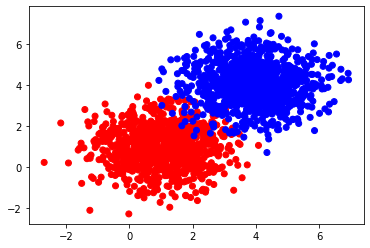

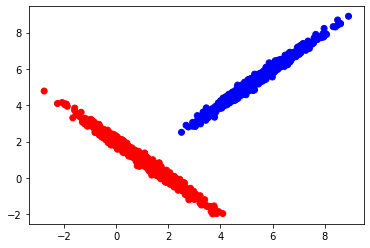

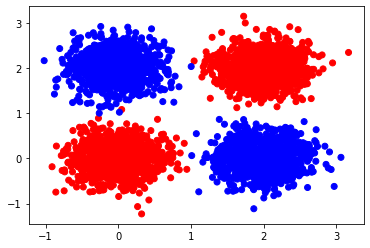

,x,y,label
201,0.417062,1.582982,0
1741,2.169758,3.664161,1
1443,2.950324,4.071128,1
1662,2.782337,3.776148,1
1659,4.678566,4.639056,1
...,...,...,...
861,-0.051999,0.406013,0
1322,3.934047,3.194697,1
208,1.757577,3.236392,0
1296,2.621795,3.023841,1


In [2]:
df_1 = pd.read_csv('dataset1.csv')
df_2 = pd.read_csv('dataset2.csv')
df_3 = pd.read_csv('dataset3.csv')
colors = {0:'red', 1:'blue'}


# df_1.plot.scatter(x = 'x', y = 'y',c=df_1['label'].map(colors))
# df_2.plot.scatter(x = 'x', y = 'y',c=df_2['label'].map(colors))
# df_3.plot.scatter(x = 'x', y = 'y',c=df_3['label'].map(colors))

train_df_1, test_df_1 = train_test_split(df_1, test_size=0.2)
train_df_2, test_df_2 = train_test_split(df_2, test_size=0.2)
train_df_3, test_df_3 = train_test_split(df_3, test_size=0.2)


plt.scatter(df_1['x'],df_1['y'],c=df_1['label'].map(colors), label=df_1['label'])
plt.show()
plt.scatter(df_2['x'],df_2['y'],c=df_2['label'].map(colors), label=df_2['label'])
plt.show()
plt.scatter(df_3['x'],df_3['y'],c=df_3['label'].map(colors), label=df_3['label'])
plt.show()

train_df_1

# Perceptron

In [3]:
class Perceptron(object):
    def __init__(self, no_of_inputs, activation_function, order,epochs, learning_rate=0.01):
      self.learning_rate = learning_rate    # alpha
      self.weights = np.random.uniform(-1, 1, no_of_inputs * order + 1)
      self.activation_function = activation_function
      self.order = order
      self.epochs = epochs
      self.accuracy_train = []
      self.accuracy_test = []

    def create_sample(self,inputs):
      new_arr = []
      for ord in range(2,self.order+1):
        new_arr.extend([ele ** ord for ele in inputs])
      return np.append([1],np.append(inputs,new_arr))
    
    def accuracy(self, t_inputs, labels,is_train):
      n_true = 0
      for inputs, label in zip(t_inputs, labels):
        if self.predict_sample(inputs) == label:
          n_true += 1

      if is_train:
        self.accuracy_train.append(n_true/len(t_inputs))
      else:
        self.accuracy_test.append(n_true/len(t_inputs))
      return 
    
    def predict_sample(self, inputs):
      inp = self.create_sample(inputs)
      summation = np.dot(inp, self.weights) # self.weights[0] = Theta
      ## activation 
      y = 0
      if self.activation_function == "step":
        if summation >= 0:
          y = +1
        else:
          y = 0
      return y

    def decision_boundary(self,inputs,labels,ax):
      ax[0].scatter(inputs['x'],inputs['y'],c=labels['label'].map(colors), label=labels['label'])
      x1_range = np.linspace(-3, 7, 200)
      x2_range = np.linspace(-3, 7, 200)
      x, y = np.meshgrid(x1_range, x2_range)
      if self.order == 1:
        equation = self.weights[1]*x + self.weights[2]*y + self.weights[0]
      elif self.order == 2:
        equation = self.weights[1]*x + self.weights[2]*y + self.weights[3]*x**2 + self.weights[4]*y**2 + self.weights[0]
      ax[0].contour(x, y, equation, [0])
      return (self.accuracy_train[-1],self.accuracy_test[-1])

    def train(self, train_inputs, train_labels,test_inputs, test_labels):
        for _ in range(self.epochs):
          for inputs, label in zip(train_inputs, train_labels):
            prediction = self.predict_sample(inputs)                                           
            self.weights += (self.learning_rate * (label - prediction) * self.create_sample(inputs))
          self.accuracy(train_inputs, train_labels,True)
          self.accuracy(test_inputs, test_labels,False)

    def plot_accuracy(self,ax):
      ax[1].plot(self.accuracy_train,color='Red',label='train_set')
      ax[1].plot(self.accuracy_test,color='Blue',label='test_set')
      ax[1].legend()

## Dataset 1

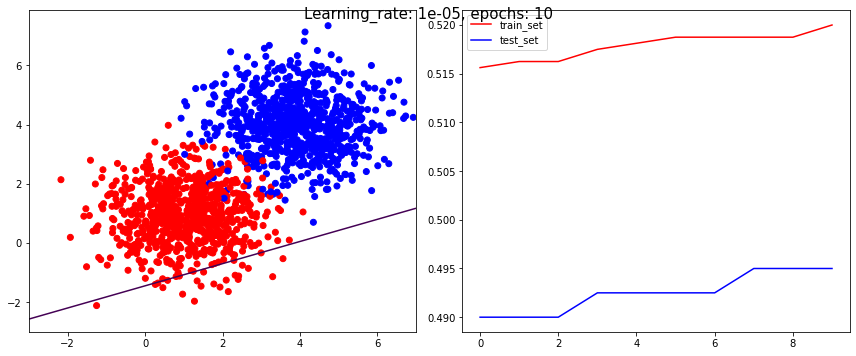

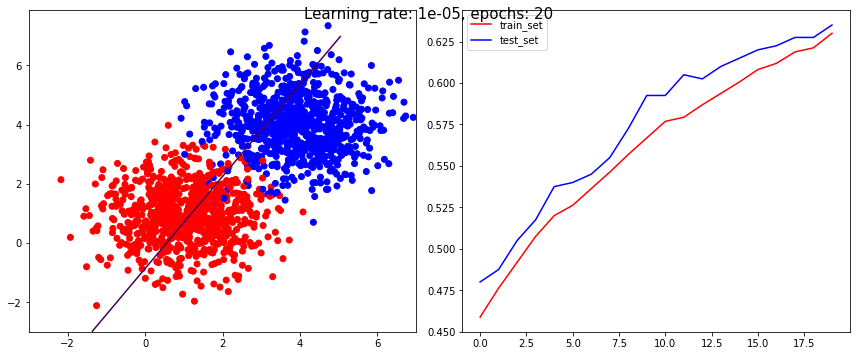

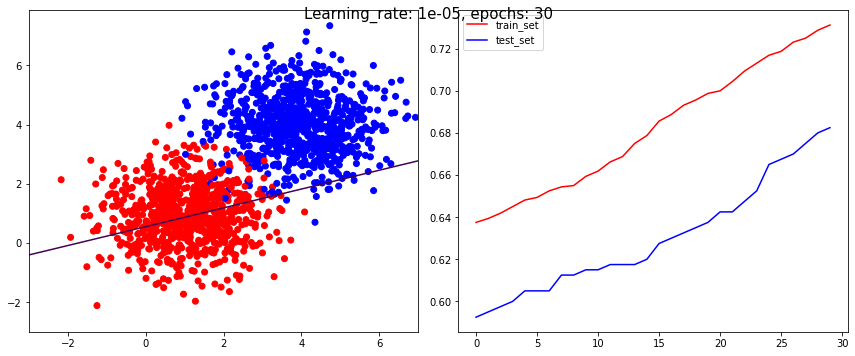

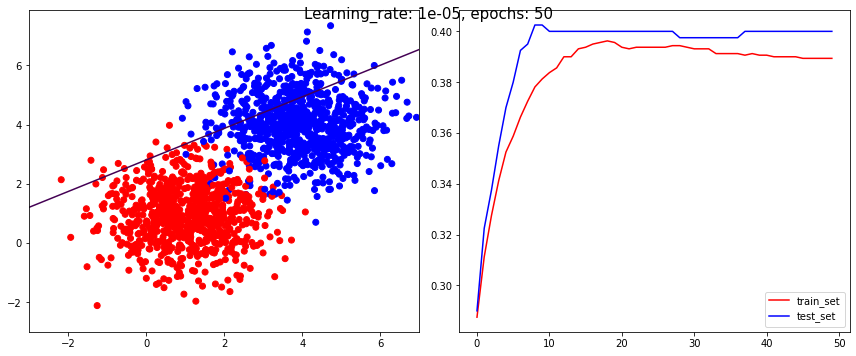

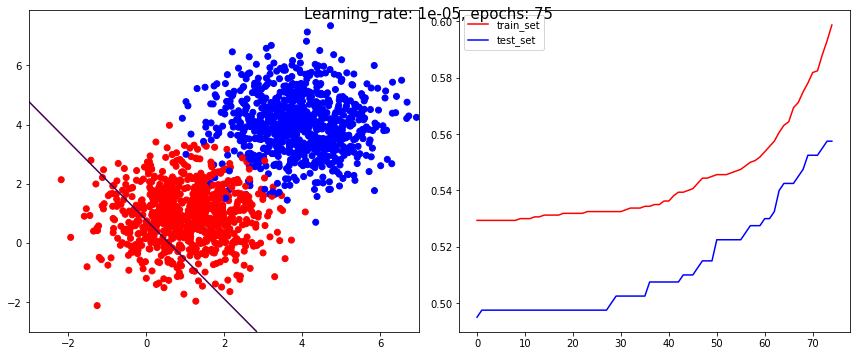

...

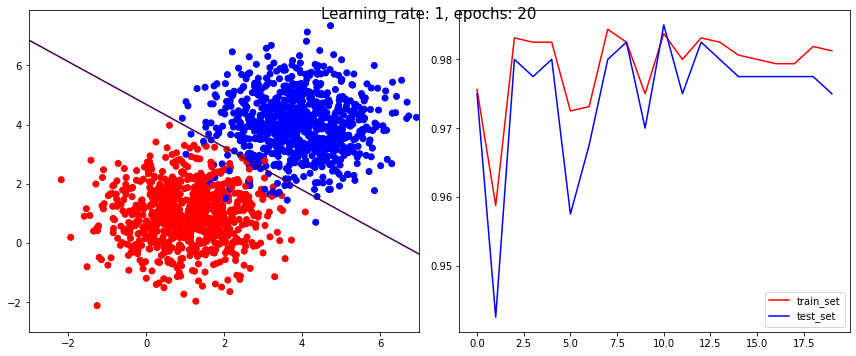

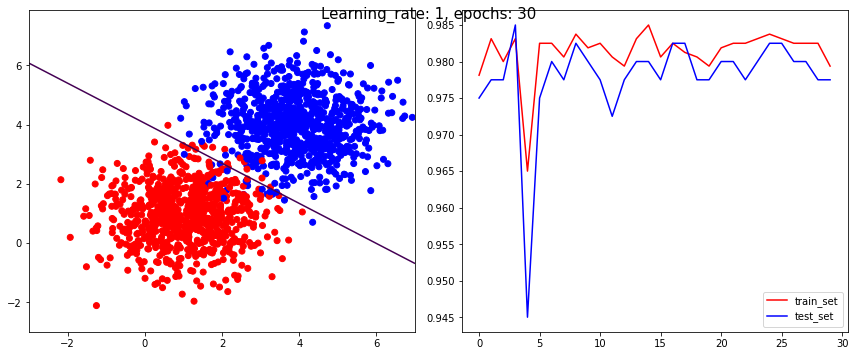

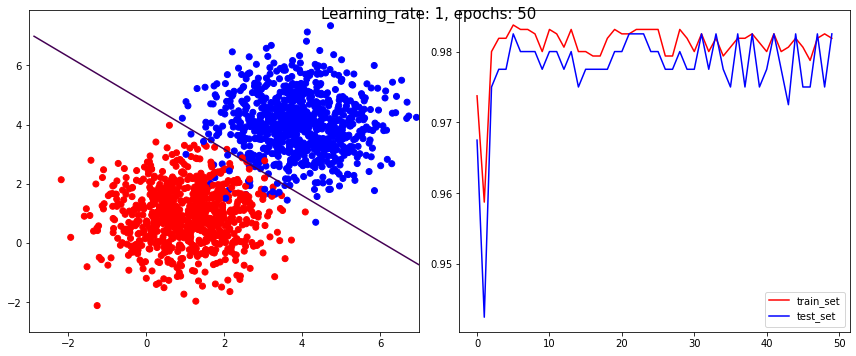

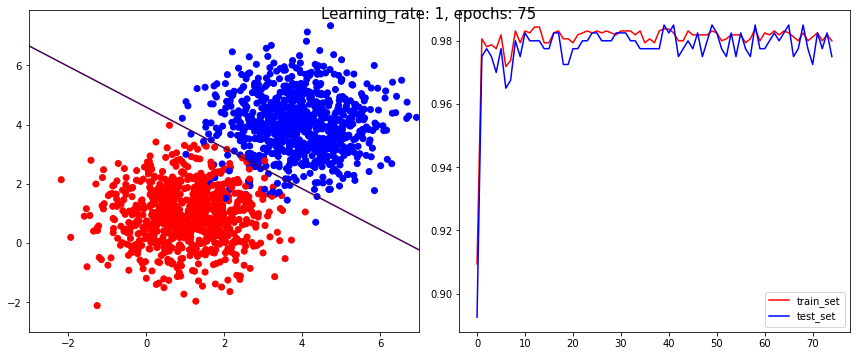

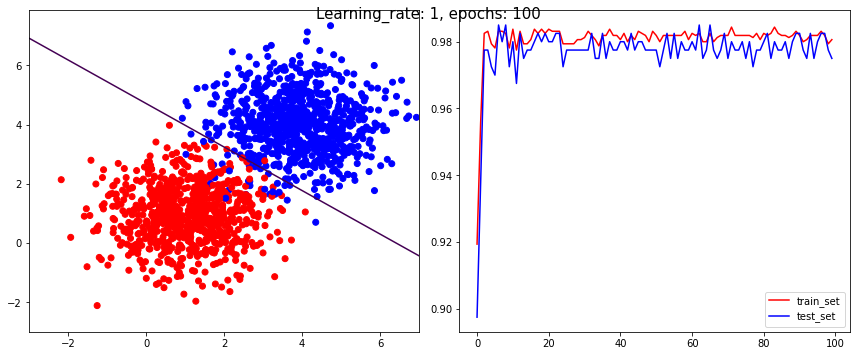

{
    "0.0001": [
        {
            "10": {
                "accuracy_test": 0.3575,
                "accuracy_train": 0.370625
            }
        },
        {
            "20": {
                "accuracy_test": 0.9775,
                "accuracy_train": 0.98125
            }
        },
        {
            "30": {
                "accuracy_test": 0.9825,
                "accuracy_train": 0.985
            }
        },
        {
            "50": {
                "accuracy_test": 0.98,
                "accuracy_train": 0.98375
            }
        },
        {
            "75": {
                "accuracy_test": 0.98,
                "accuracy_train": 0.98125
            }
        },
        {
            "100": {
                "accuracy_test": 0.975,
                "accuracy_train": 0.9825
            }
        }
    ],
    "0.001": [
        {
            "10": {
                "accuracy_test": 0.98,
                "accuracy_train": 0.983125
            }
        },
  

In [4]:
learning_rate = [1e-05, 1e-04, 1e-03, 0.01, 0.1, 1]
epochs = [10, 20, 30, 50, 75, 100]
inputs = train_df_1
test_inputs = test_df_1
result = {}
for alpha in learning_rate:
  result[f'{alpha}'] = [] 
  for ep in epochs:
    perceptron = Perceptron(no_of_inputs=2, activation_function='step', order=1, epochs=ep, learning_rate=alpha)
    plt.rcParams["figure.autolayout"] = True
    fig, ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f"Learning_rate: {alpha}, epochs: {ep}", fontsize=15)
    perceptron.train(inputs.to_numpy()[:,0:2],inputs.to_numpy()[:,2],test_inputs.to_numpy()[:,0:2],test_inputs.to_numpy()[:,2])        
    accuracy_train, accuracy_test = perceptron.decision_boundary(inputs[inputs.columns[0:2]],inputs[inputs.columns[2:3]],ax)
    result[f'{alpha}'].append({f'{ep}':{'accuracy_train':accuracy_train, 'accuracy_test':accuracy_test}}) 
    perceptron.plot_accuracy(ax)
    plt.show()
print(json.dumps(result,sort_keys=True, indent=4))


## Dataset 2

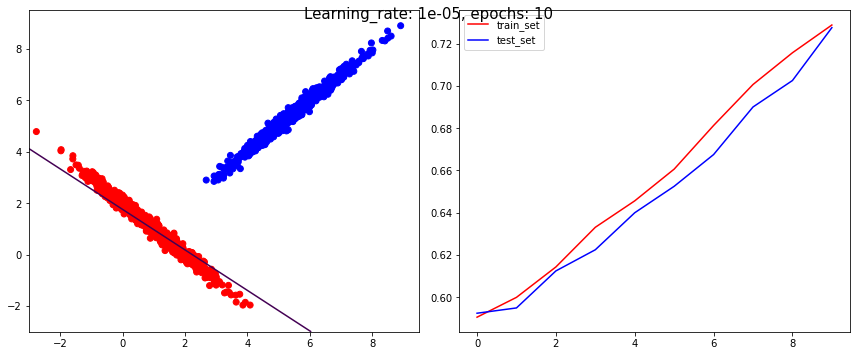

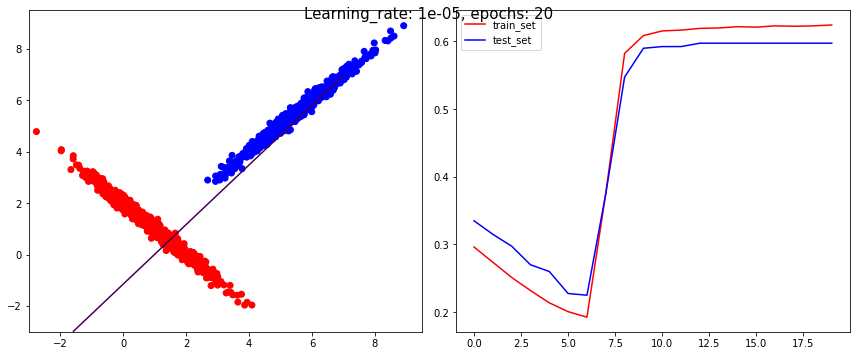

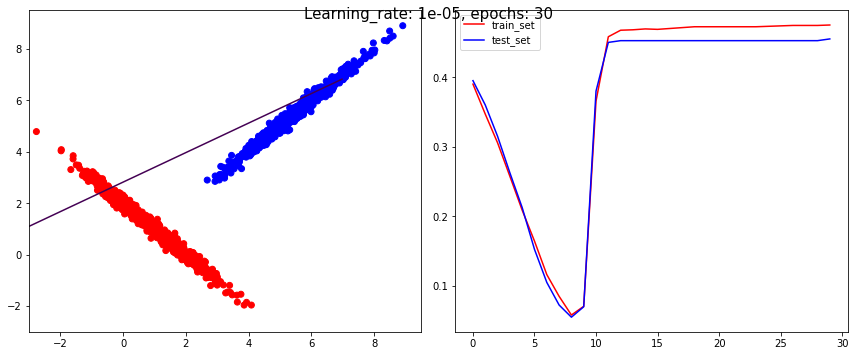

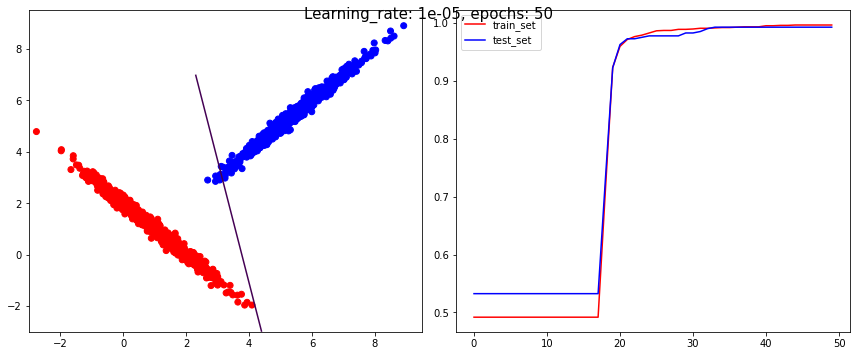

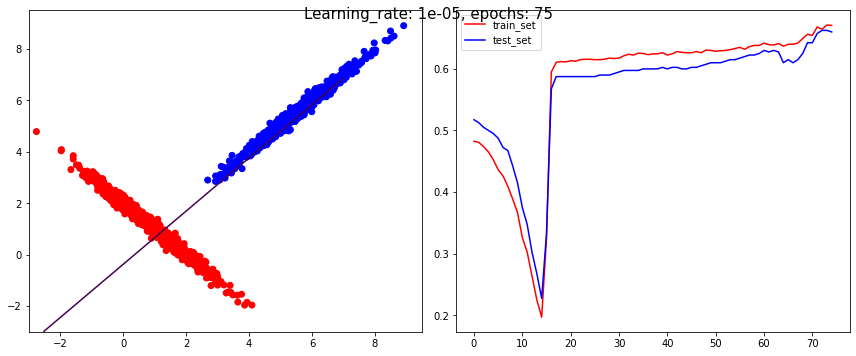

...

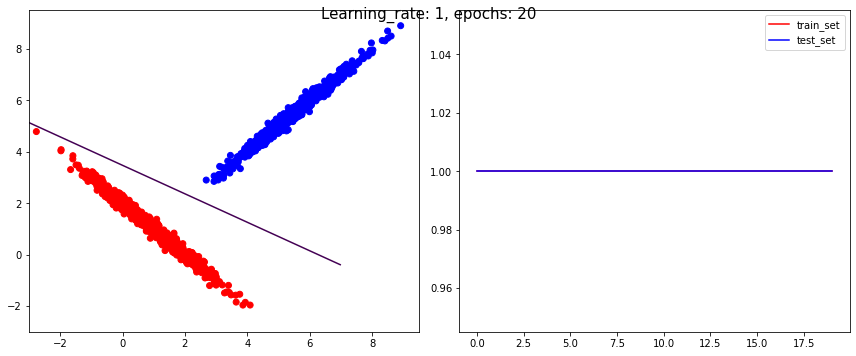

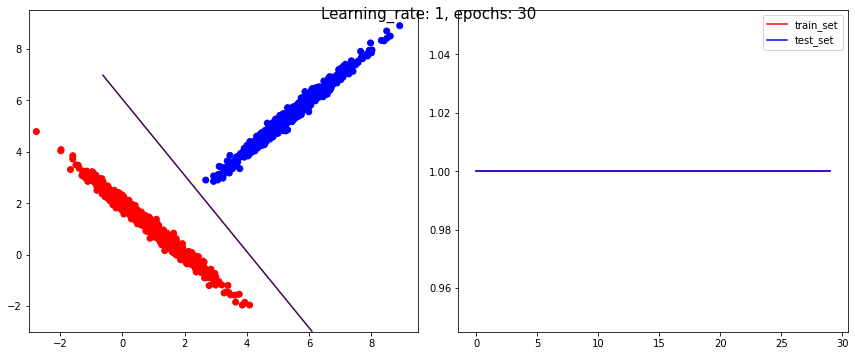

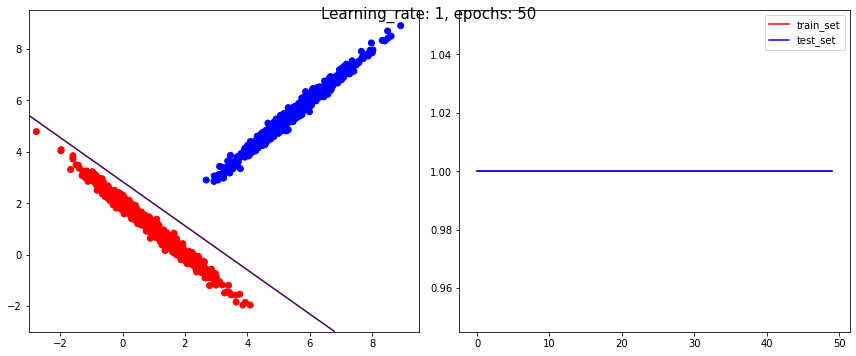

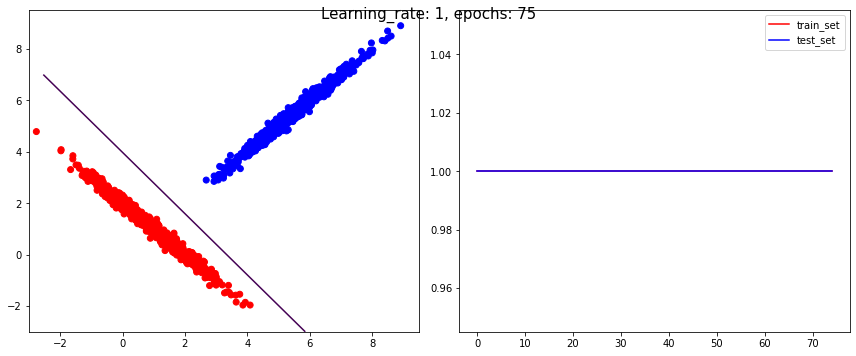

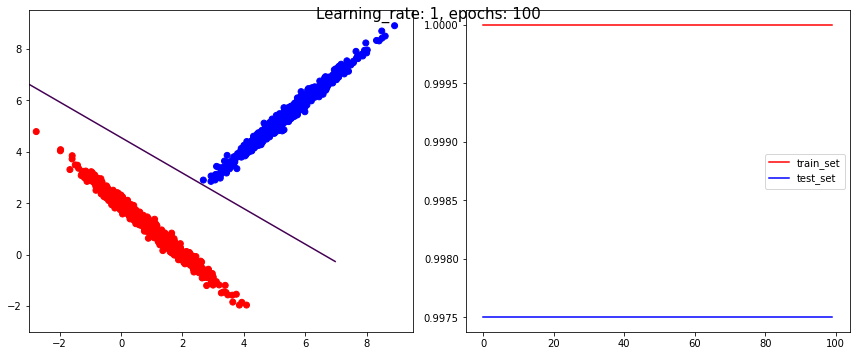

{
    "0.0001": [
        {
            "10": {
                "accuracy_test": 0.895,
                "accuracy_train": 0.921875
            }
        },
        {
            "20": {
                "accuracy_test": 0.995,
                "accuracy_train": 0.999375
            }
        },
        {
            "30": {
                "accuracy_test": 0.9975,
                "accuracy_train": 1.0
            }
        },
        {
            "50": {
                "accuracy_test": 0.9975,
                "accuracy_train": 1.0
            }
        },
        {
            "75": {
                "accuracy_test": 1.0,
                "accuracy_train": 1.0
            }
        },
        {
            "100": {
                "accuracy_test": 1.0,
                "accuracy_train": 1.0
            }
        }
    ],
    "0.001": [
        {
            "10": {
                "accuracy_test": 1.0,
                "accuracy_train": 1.0
            }
        },
        {
            "

In [5]:
learning_rate = [1e-05, 1e-04, 1e-03, 0.01, 0.1, 1]
epochs = [10, 20, 30, 50, 75, 100]
inputs = train_df_2
test_inputs = test_df_2
result = {}
for alpha in learning_rate:
  result[f'{alpha}'] = [] 
  for ep in epochs:
    perceptron = Perceptron(no_of_inputs=2, activation_function='step', order=1, epochs=ep, learning_rate=alpha)
    plt.rcParams["figure.autolayout"] = True
    fig, ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f"Learning_rate: {alpha}, epochs: {ep}", fontsize=15)
    perceptron.train(inputs.to_numpy()[:,0:2],inputs.to_numpy()[:,2],test_inputs.to_numpy()[:,0:2],test_inputs.to_numpy()[:,2])        
    accuracy_train, accuracy_test = perceptron.decision_boundary(inputs[inputs.columns[0:2]],inputs[inputs.columns[2:3]],ax)
    result[f'{alpha}'].append({f'{ep}':{'accuracy_train':accuracy_train, 'accuracy_test':accuracy_test}}) 
    perceptron.plot_accuracy(ax)
    plt.show()
print(json.dumps(result,sort_keys=True, indent=4))

# Adaline

In [6]:
class Adaline(object):
    def __init__(self, no_of_inputs, activation_function, order, epochs, learning_rate=0.01):
      self.learning_rate = learning_rate    # alpha
      self.activation_function = activation_function
      self.order = order
      self.epochs = epochs
      self.accuracy_train = []
      self.accuracy_test = []
      if self.order == 1:
        self.weights = np.random.uniform(-1, 1, 3)
      elif self.order == 2:
        self.weights = np.random.uniform(-1, 1, 6)

    def create_sample(self,inputs):
      new_arr = []
      for ord in range(2,self.order+1):
        new_arr.extend([ele ** ord for ele in inputs])
      if self.order == 2:
        new_arr.append(inputs[0]*inputs[1])
      return np.append([1],np.append(inputs,new_arr))
    
    def accuracy(self, t_inputs, labels,is_train):
      n_true = 0
      for inputs, label in zip(t_inputs, labels):
        pred,_ = self.predict_sample(inputs)
        if pred == label:
          n_true += 1

      if is_train:
        self.accuracy_train.append(n_true/len(t_inputs))
      else:
        self.accuracy_test.append(n_true/len(t_inputs))
      return 
    
    def predict_sample(self, inputs):
      inp = self.create_sample(inputs)
      summation = np.dot(inp, self.weights) # self.weights[0] = Theta                        
      if np.isinf(self.weights).any():
        return (float('-inf'),float('-inf'))

      ## activation 
      y = 0
      if self.activation_function == "identity":
        pass

      elif self.activation_function == "bipolar_sigmoid":
        # y = (1 - math.exp(-summation)) / (1 + math.exp(-summation))   
        summation = np.tanh(summation)


      if summation < 0:
        y = -1
      else:
        y = 1
      return y,summation

    def decision_boundary(self,inputs,labels,ax):
      ax[0].scatter(inputs['x'],inputs['y'],c=np.sign(labels['label']), label=labels['label'])
      x1_range = np.linspace(-3, 7, 200)
      x2_range = np.linspace(-3, 7, 200)
      x, y = np.meshgrid(x1_range, x2_range)
      if self.order == 1:
        equation = self.weights[1]*x + self.weights[2]*y + self.weights[0]
      elif self.order == 2:
        equation = self.weights[1]*x + self.weights[2]*y + self.weights[3]*(x**2) + self.weights[4]*(y**2) + self.weights[5]*x*y + self.weights[0]
      ax[0].contour(x, y, equation, [0])
      return (self.accuracy_train[-1],self.accuracy_test[-1])

    def train(self, train_inputs, train_labels,test_inputs, test_labels, batch=-1):
        print("train")
        for iter in range(self.epochs):
          counter_batch, delta_Xk = 0, 0
          for inputs, label in zip(train_inputs, train_labels):
            prediction,I = self.predict_sample(inputs)    
            if prediction == float('-inf'):
              return False
            if batch == -1:
              self.weights[1:] += (((self.learning_rate*10)/(10+iter)) * (label - I) * self.create_sample(inputs)[1:])
              self.weights[0] += (((self.learning_rate*10)/(10+iter)) * (label - I))
            else:
              if counter_batch < batch:
                delta_Xk += (label - I) * self.create_sample(inputs)
                counter_batch += 1
              else:
                self.weights += (((self.learning_rate*10)/(10+iter)) * (delta_Xk/batch))
                counter_batch, delta_Xk = 0, 0

          self.accuracy(train_inputs, train_labels,True)
          self.accuracy(test_inputs, test_labels,False)
        return True             

    def plot_accuracy(self,ax):
      plt.plot(self.accuracy_train,color='Red',label='train_set')
      plt.plot(self.accuracy_test,color='Blue',label='test_set')
      ax[1].legend()

## Dataset 1

train


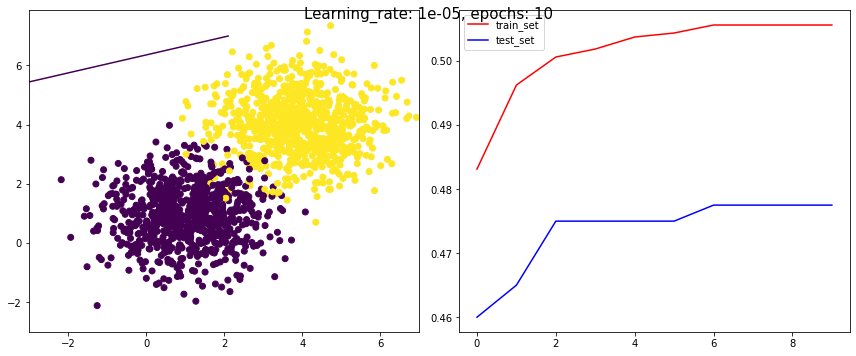

train


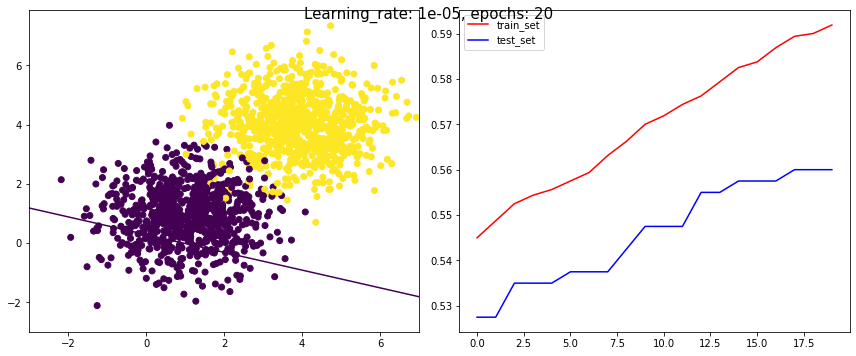

train


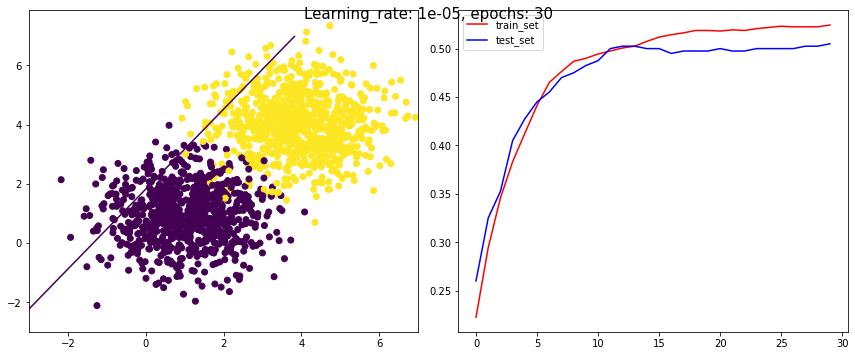

train


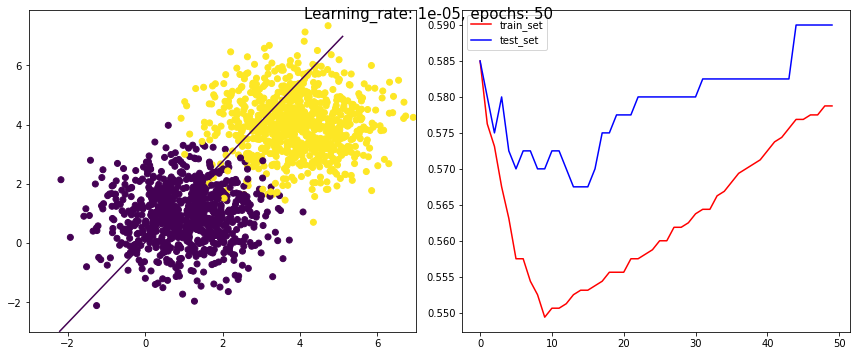

train


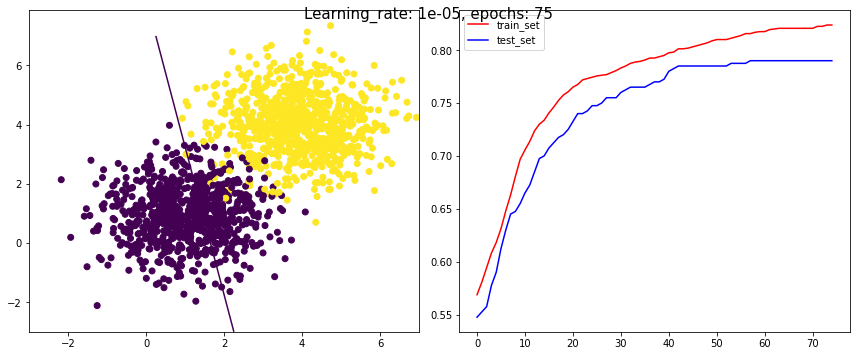

train


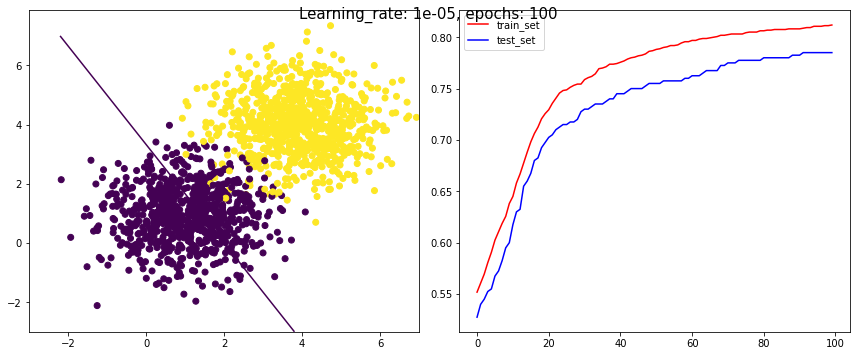

train


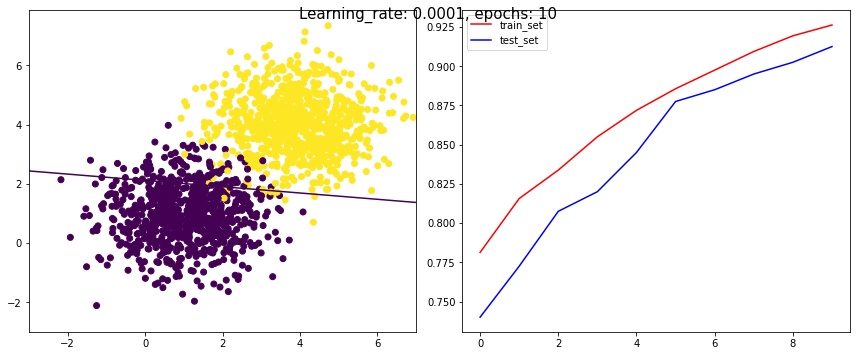

train


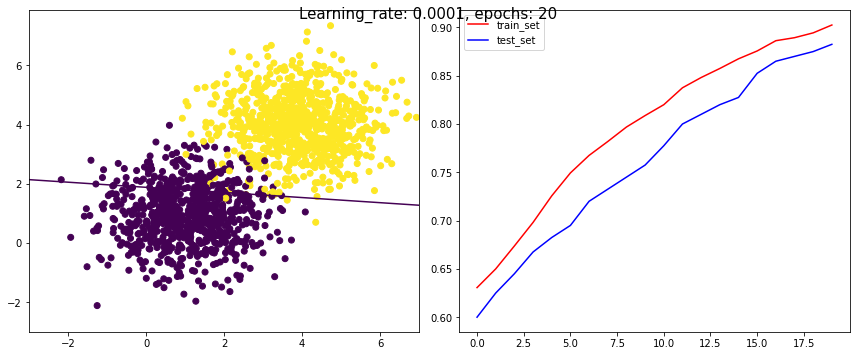

train


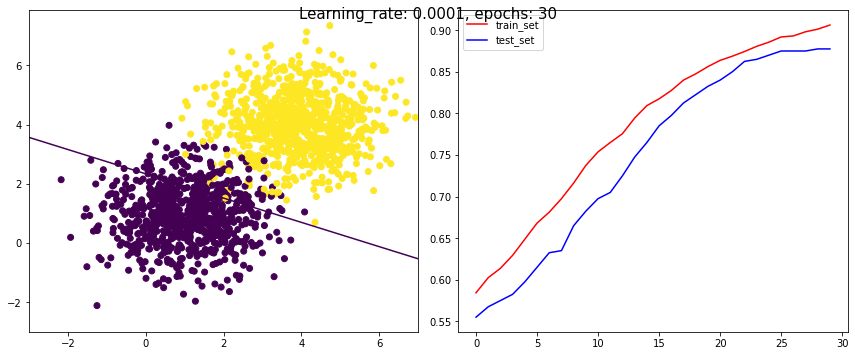

train


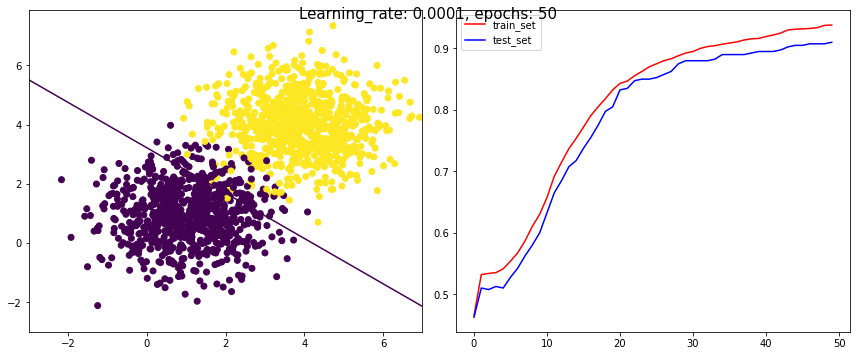

train


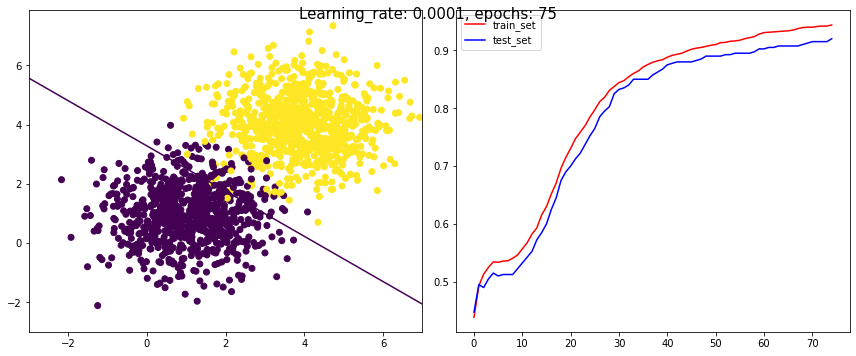

train


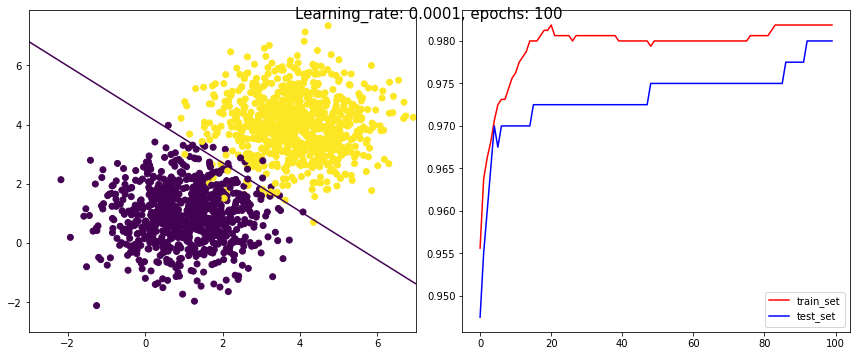

train


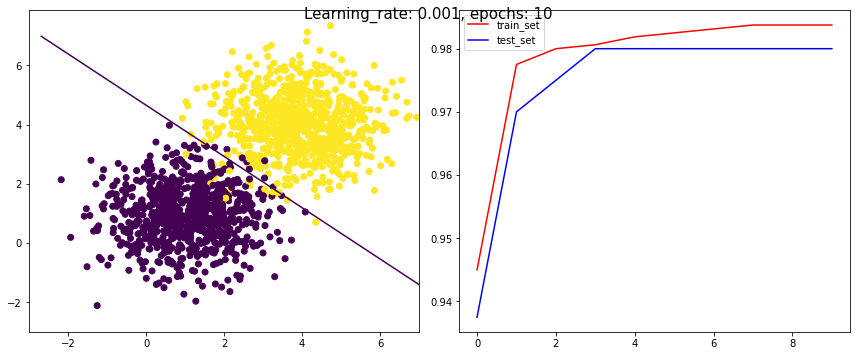

train


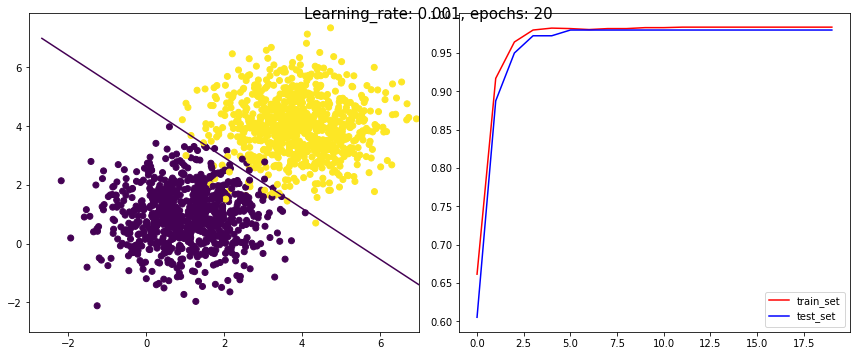

train


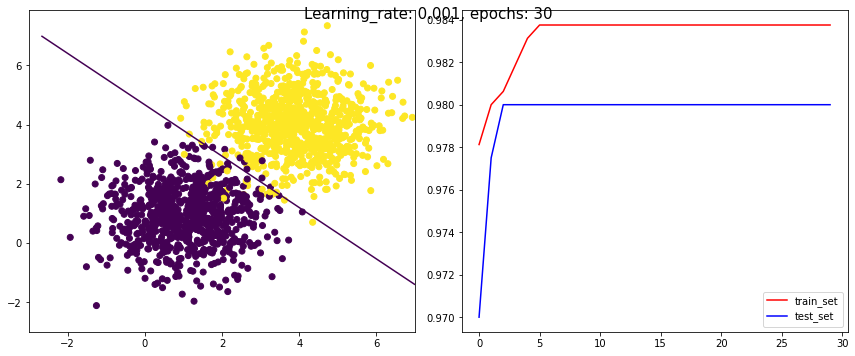

train


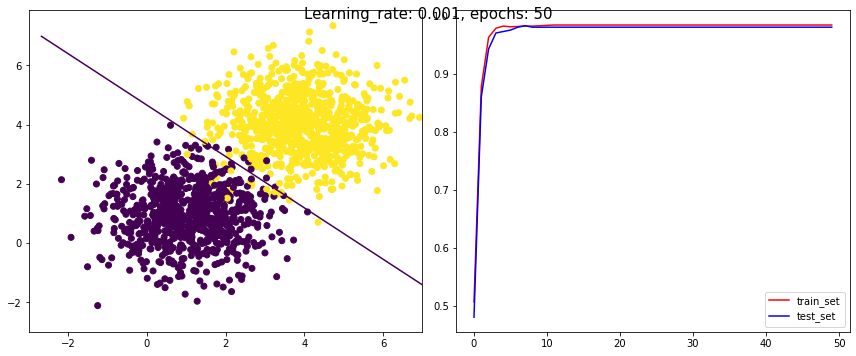

train


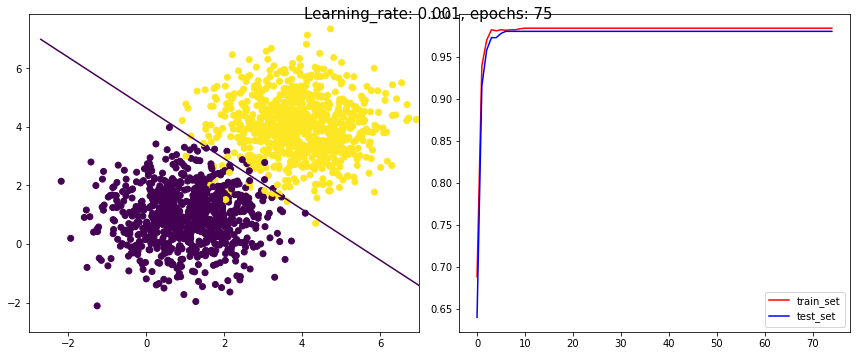

train


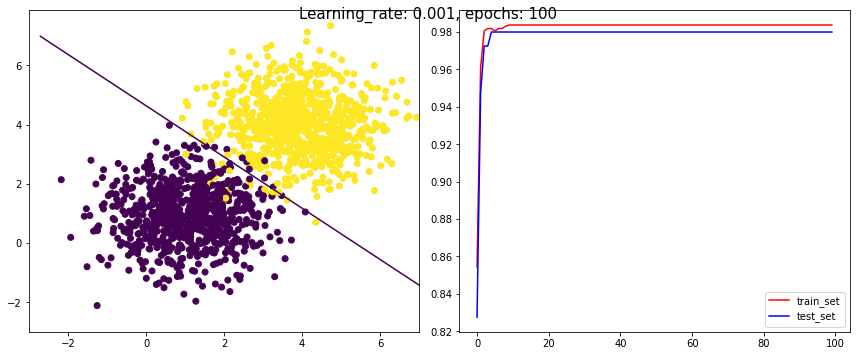

train


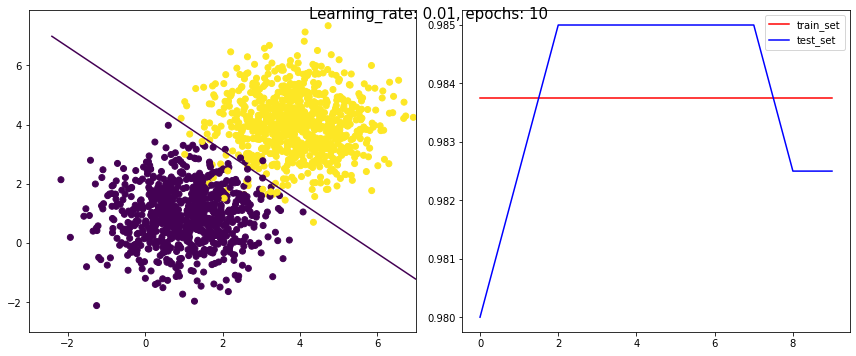

train


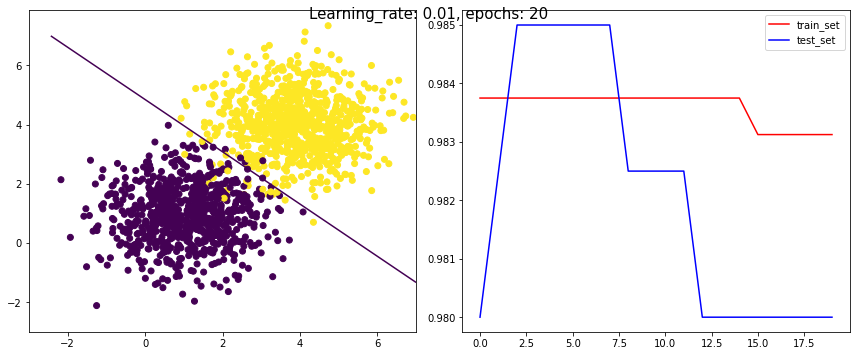

train


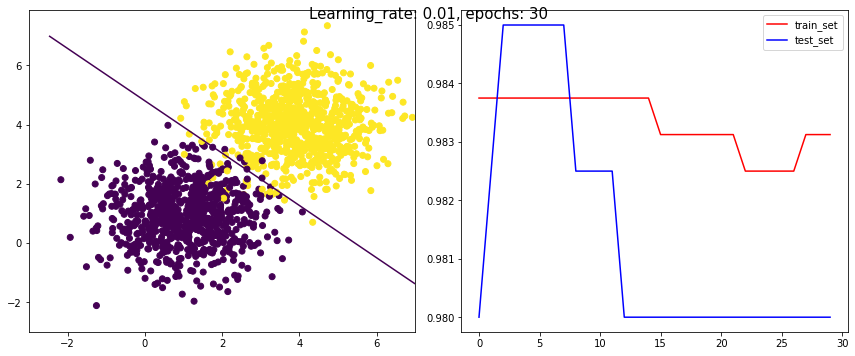

train


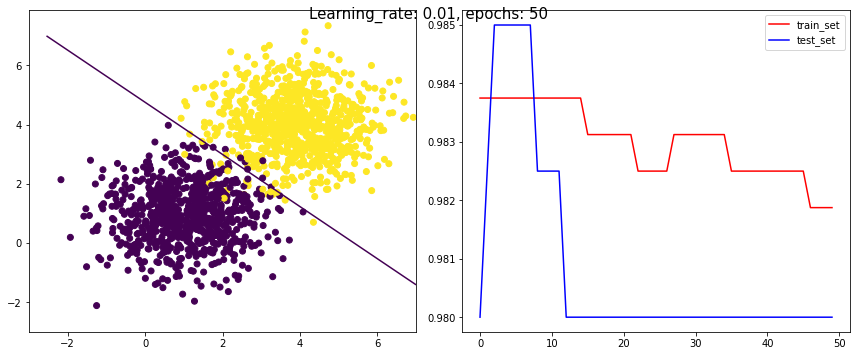

train


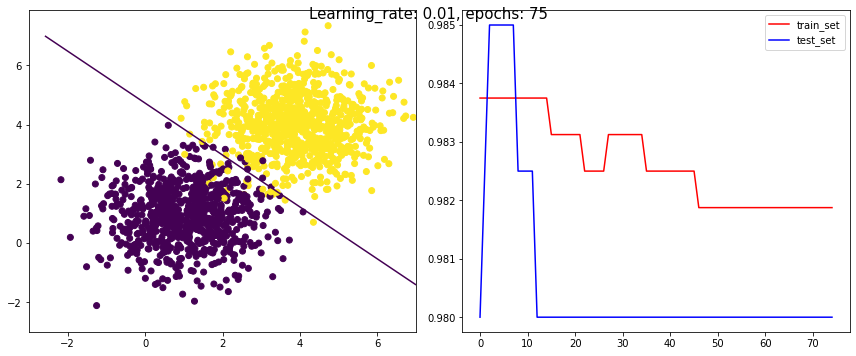

train


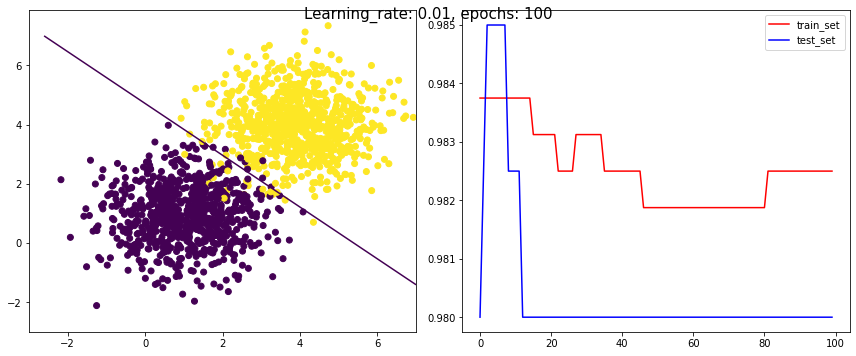

train


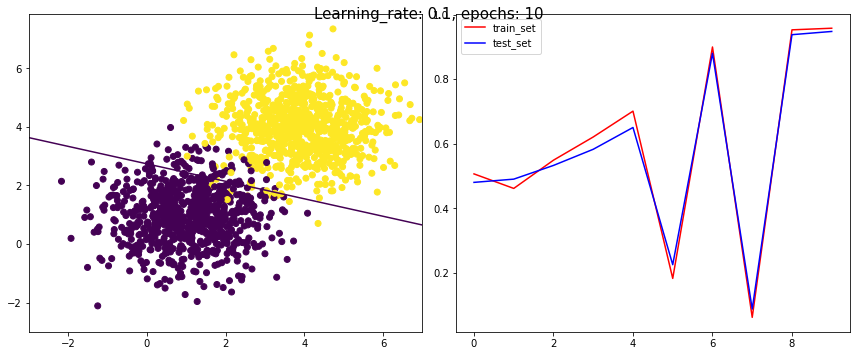

train


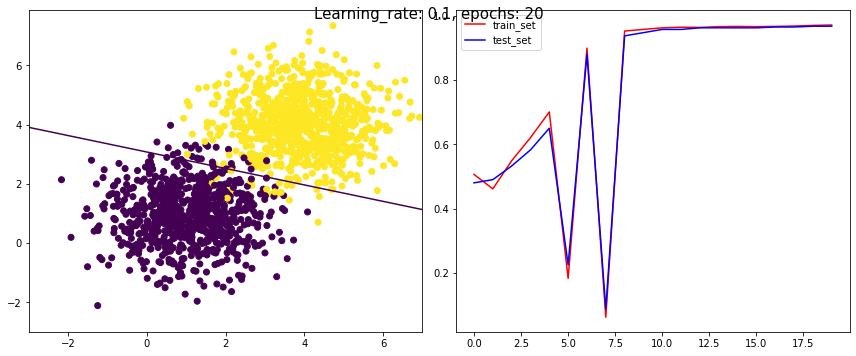

train


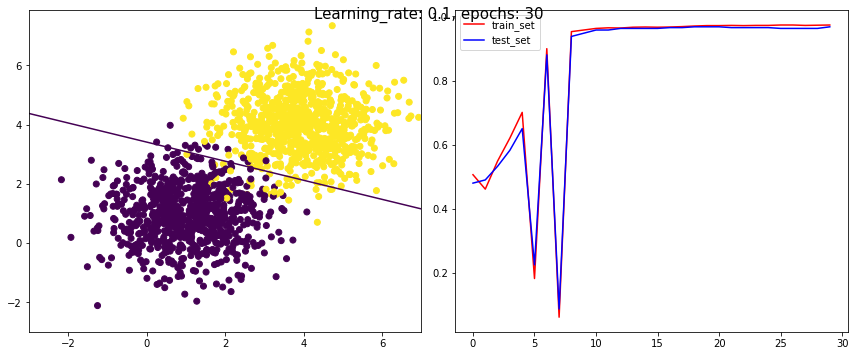

train


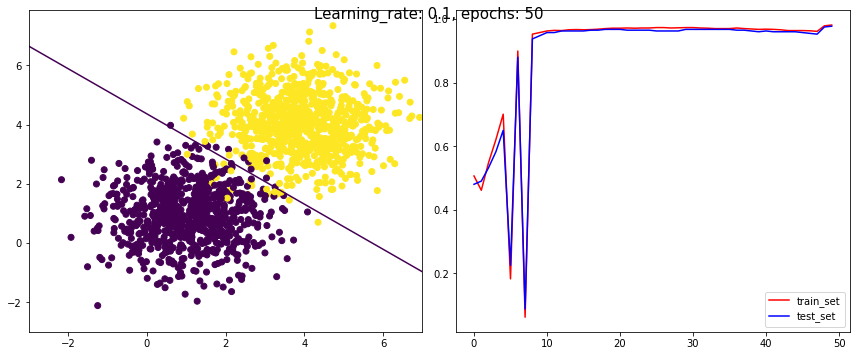

train


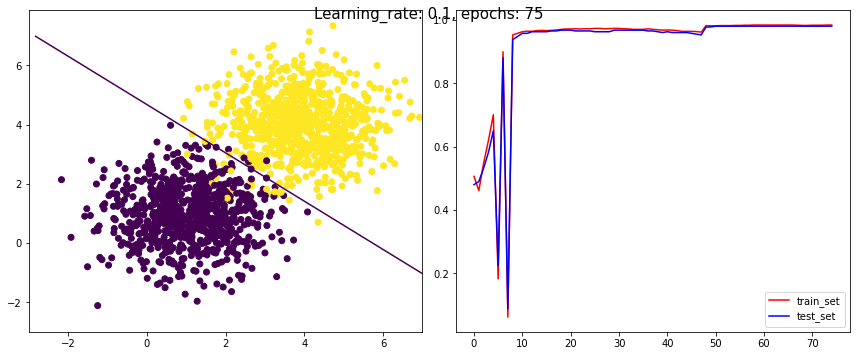

train


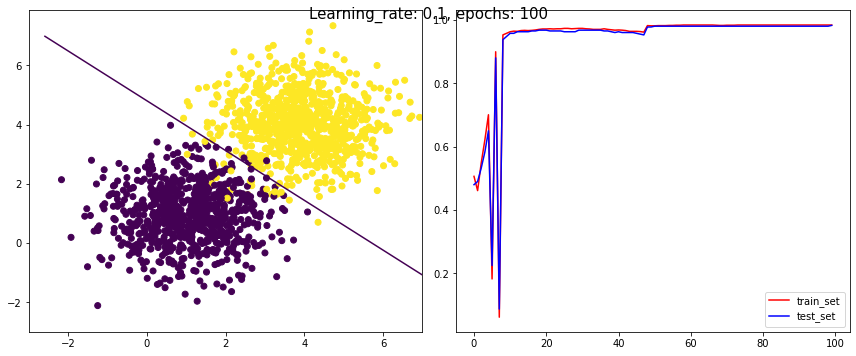

train
train
train
train
train

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: RuntimeWarning: overflow encountered in multiply



train
{
    "0.0001": [
        {
            "10": {
                "accuracy_test": 0.9125,
                "accuracy_train": 0.92625
            }
        },
        {
            "20": {
                "accuracy_test": 0.8825,
                "accuracy_train": 0.9025
            }
        },
        {
            "30": {
                "accuracy_test": 0.8775,
                "accuracy_train": 0.90625
            }
        },
        {
            "50": {
                "accuracy_test": 0.91,
                "accuracy_train": 0.938125
            }
        },
        {
            "75": {
                "accuracy_test": 0.92,
                "accuracy_train": 0.94375
            }
        },
        {
            "100": {
                "accuracy_test": 0.98,
                "accuracy_train": 0.981875
            }
        }
    ],
    "0.001": [
        {
            "10": {
                "accuracy_test": 0.98,
                "accuracy_train": 0.98375
            }
     

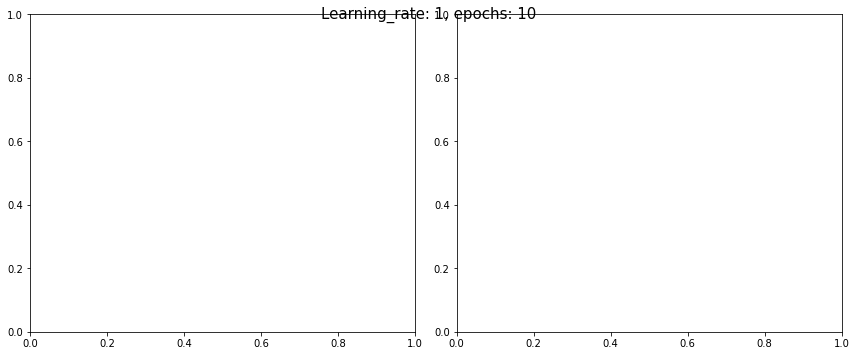

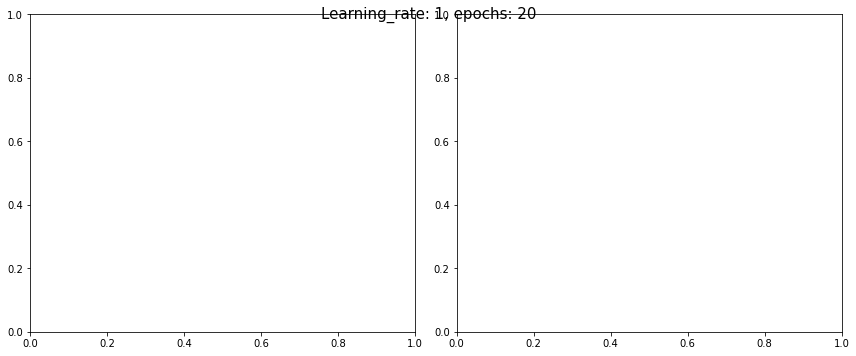

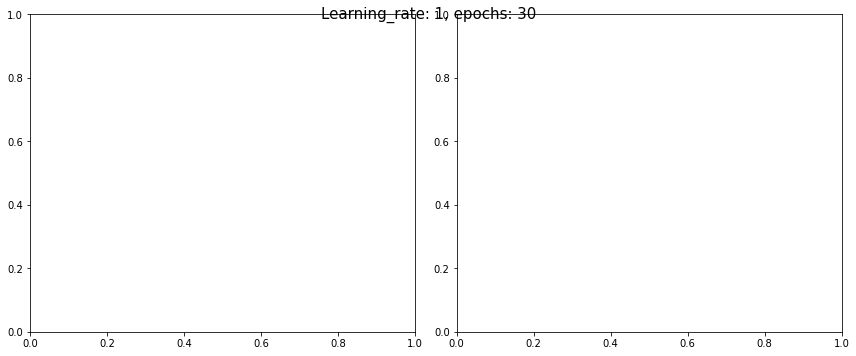

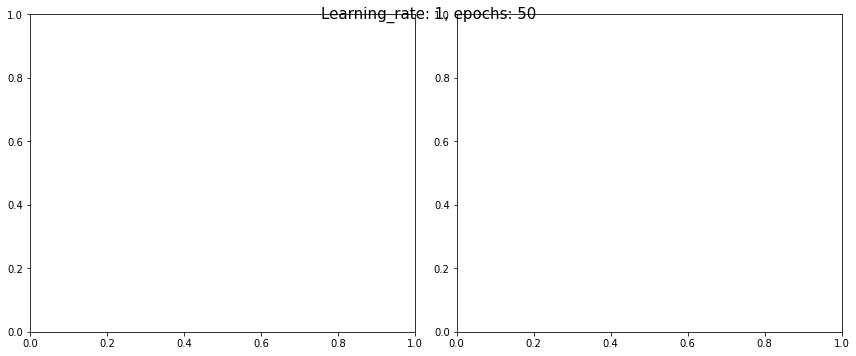

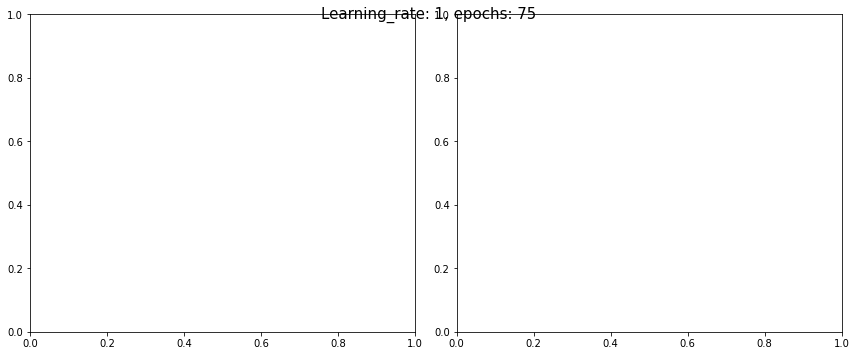

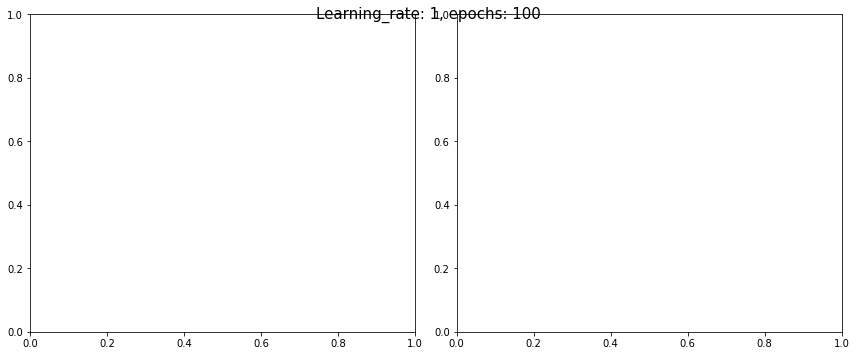

In [7]:
learning_rate = [1e-05, 1e-04, 1e-03, 0.01, 0.1, 1]
epochs = [10, 20, 30, 50, 75, 100]
inputs = train_df_1.copy(deep=True)
test_inputs = test_df_1.copy(deep=True)
inputs['label'] = inputs['label'].replace([0], -1)
test_inputs['label'] = test_inputs['label'].replace([0], -1)
result = {}
for alpha in learning_rate:
  result[f'{alpha}'] = [] 
  for ep in epochs:
    adaline = Adaline(no_of_inputs = 2, activation_function='identity',order = 1,epochs = ep,learning_rate=alpha)
    plt.rcParams["figure.autolayout"] = True
    fig, ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f"Learning_rate: {alpha}, epochs: {ep}", fontsize=15)
    res = adaline.train(inputs.to_numpy()[:,0:2],inputs.to_numpy()[:,2],test_inputs.to_numpy()[:,0:2],test_inputs.to_numpy()[:,2],batch=-1)   
    if res:     
      accuracy_train, accuracy_test = adaline.decision_boundary(inputs[inputs.columns[0:2]],inputs[inputs.columns[2:3]],ax)
      result[f'{alpha}'].append({f'{ep}':{'accuracy_train':accuracy_train, 'accuracy_test':accuracy_test}}) 
      
      adaline.plot_accuracy(ax)
      plt.show()
print(json.dumps(result,sort_keys=True, indent=4))

## Dataset 2

train


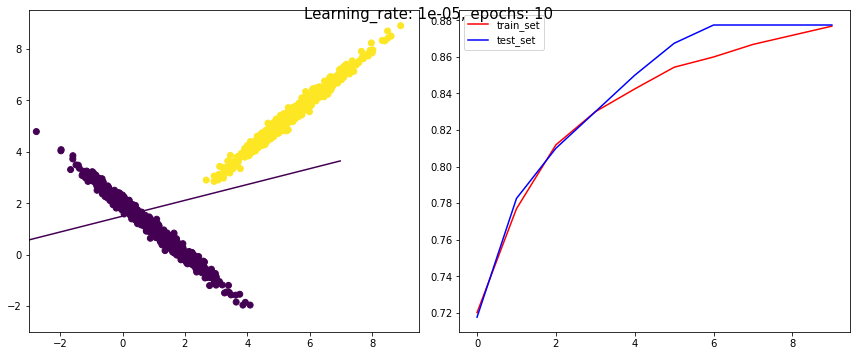

train


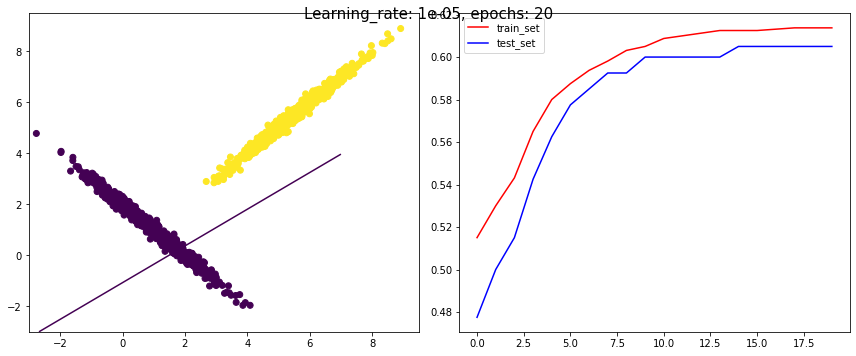

train


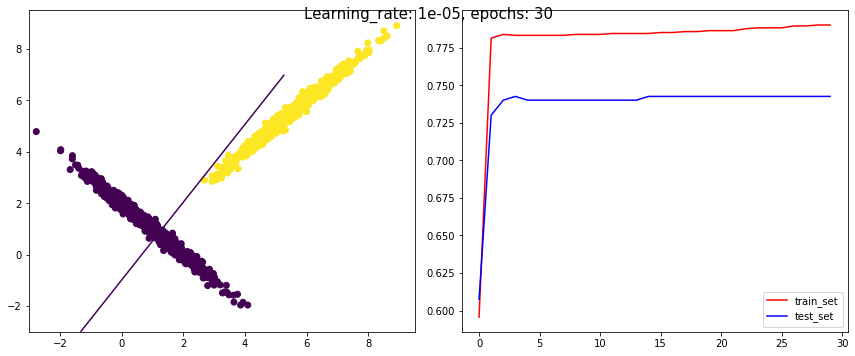

train


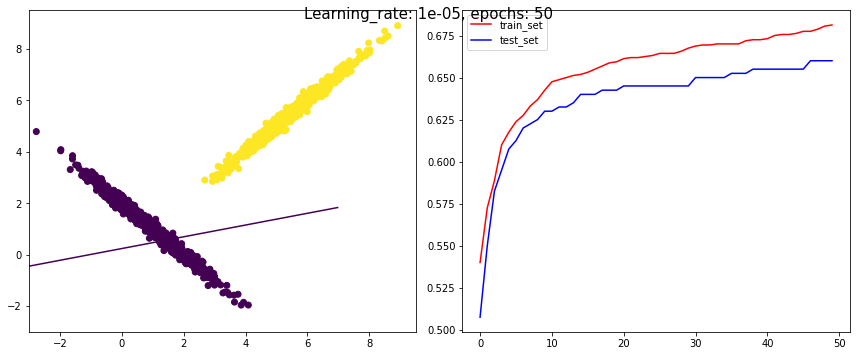

train


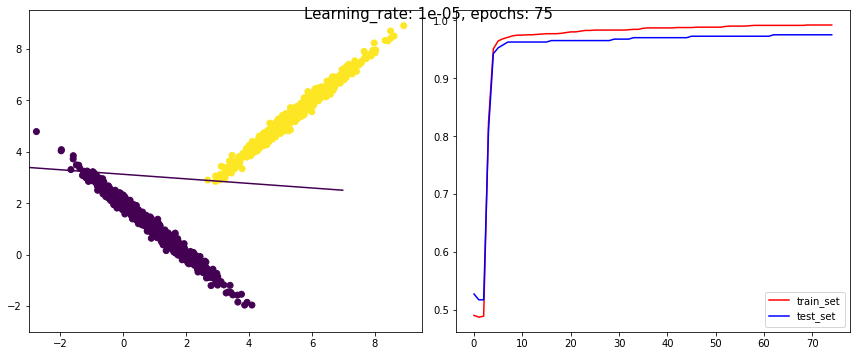

train


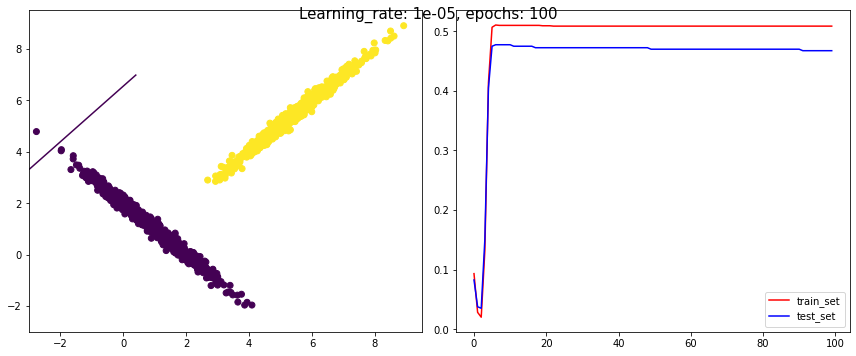

train


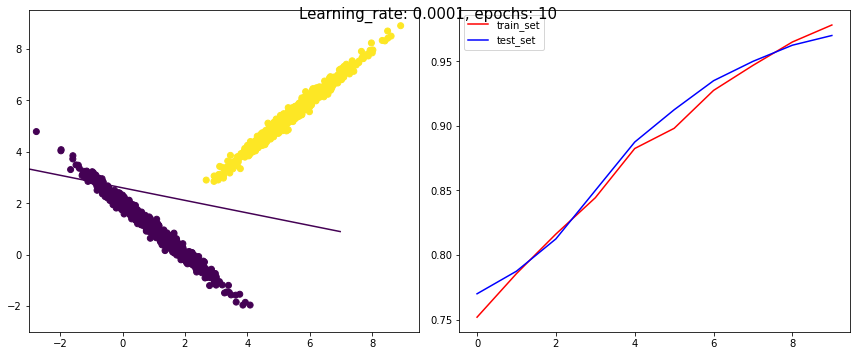

train


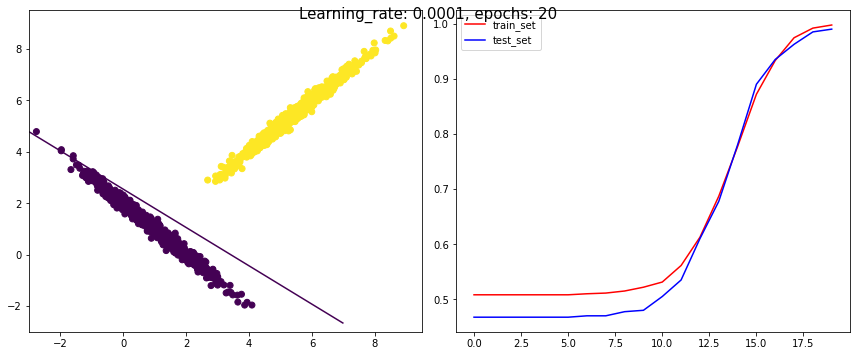

train


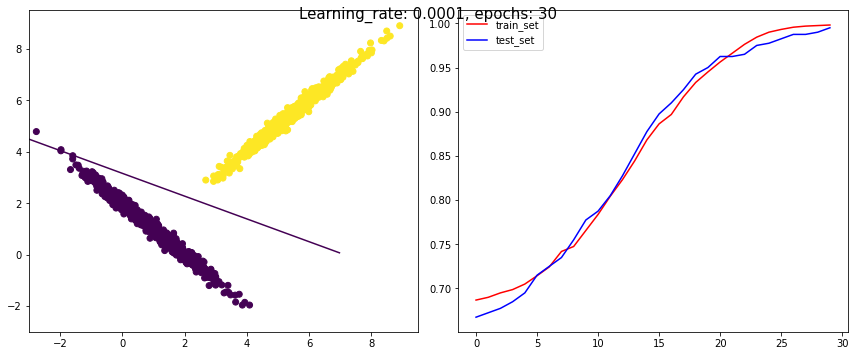

train


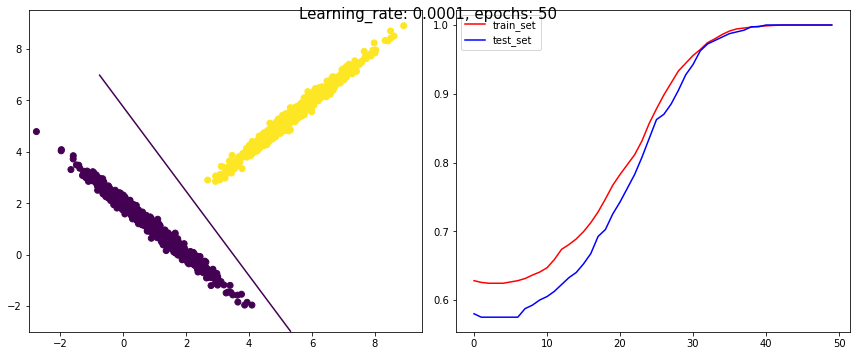

train


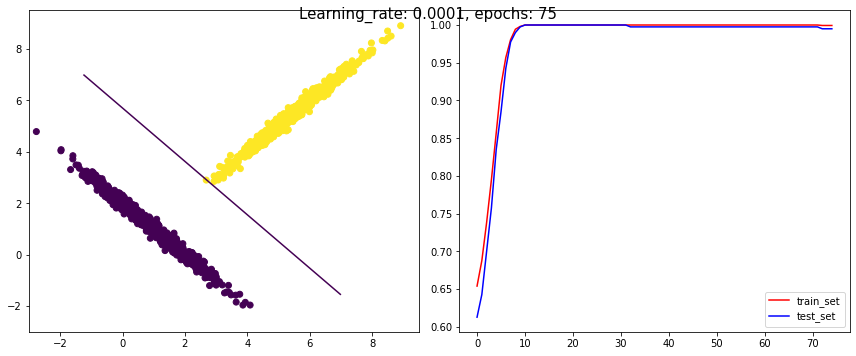

train


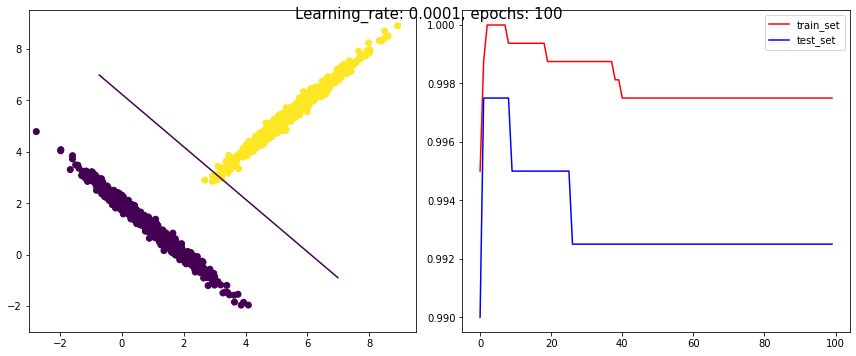

train


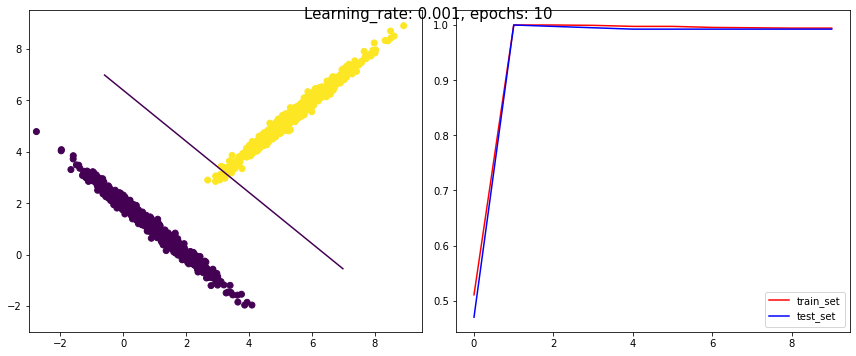

train


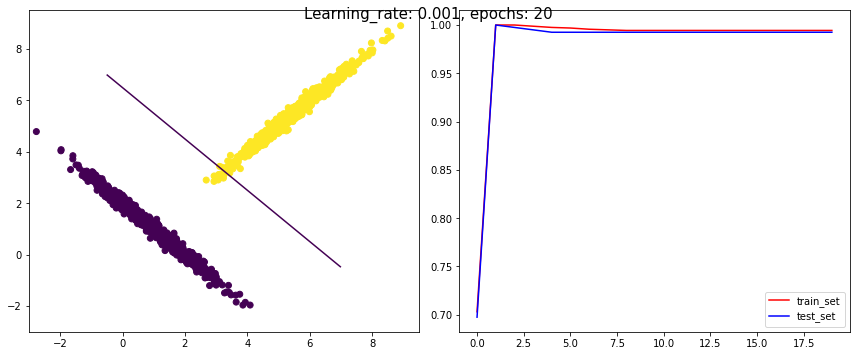

train


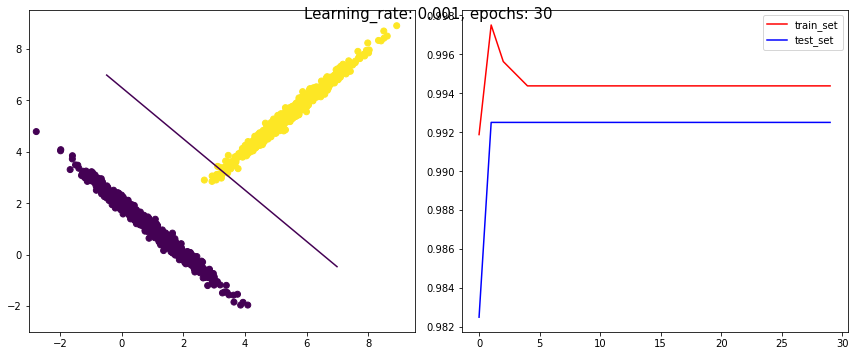

train


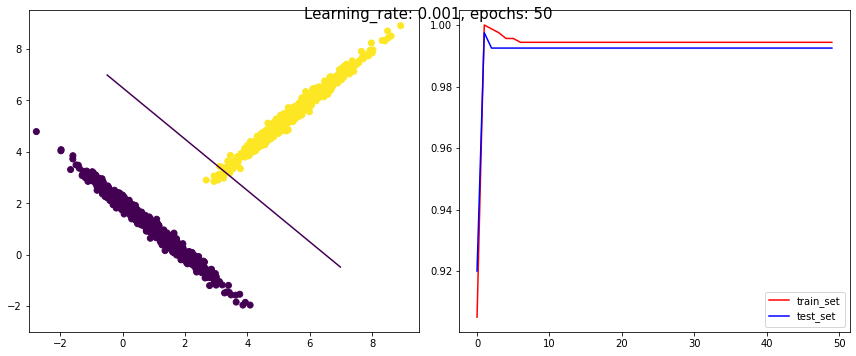

train


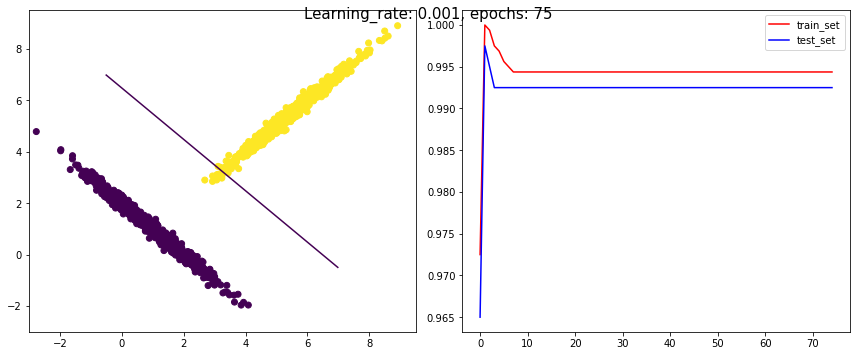

train


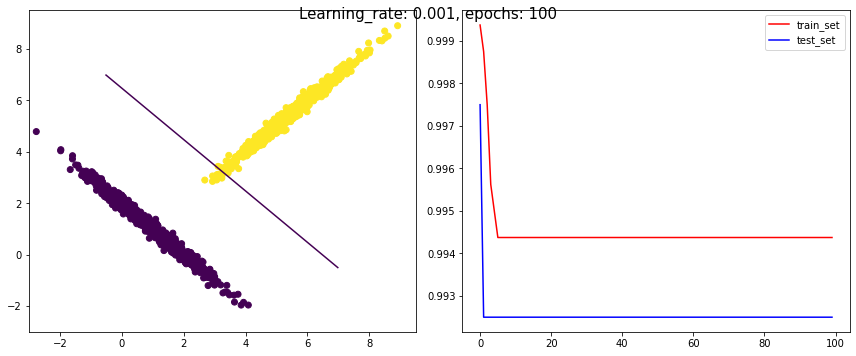

train


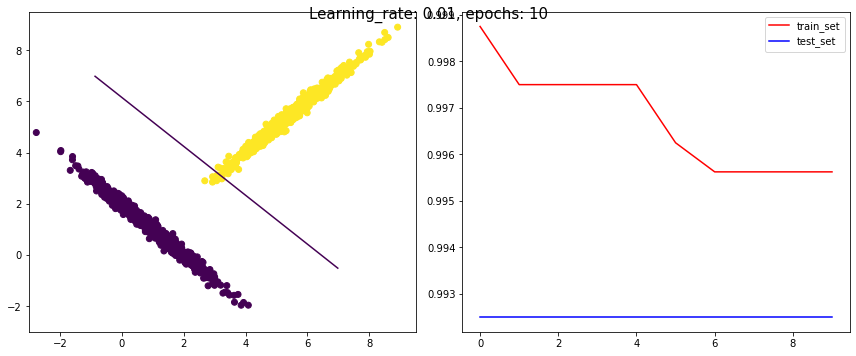

train


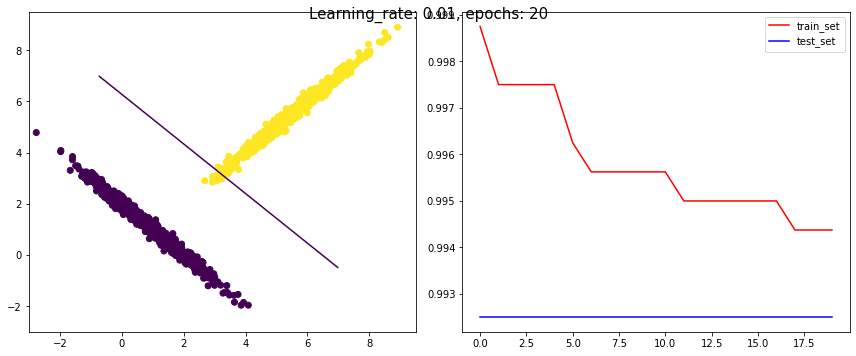

train


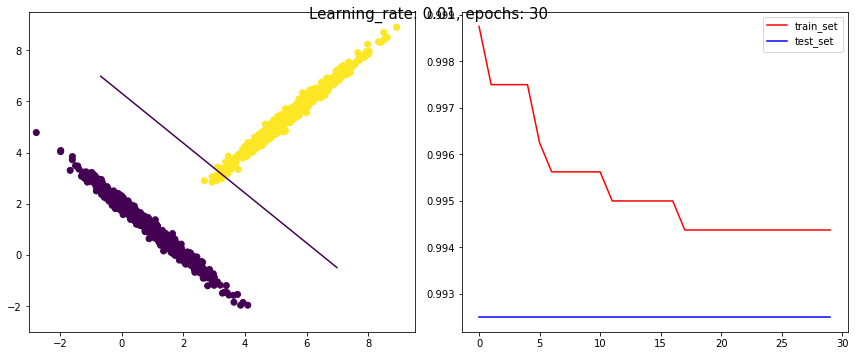

train


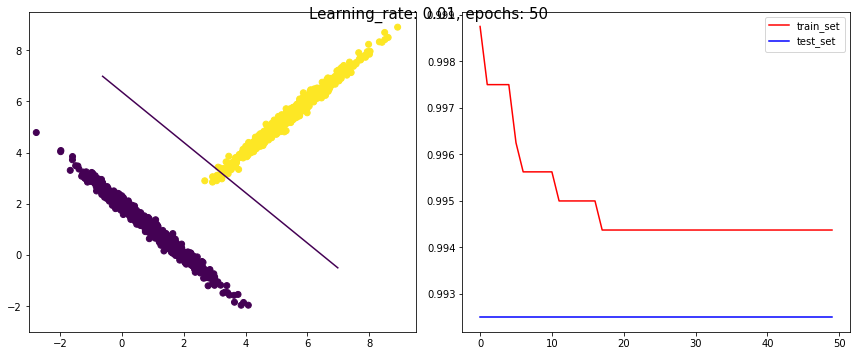

train


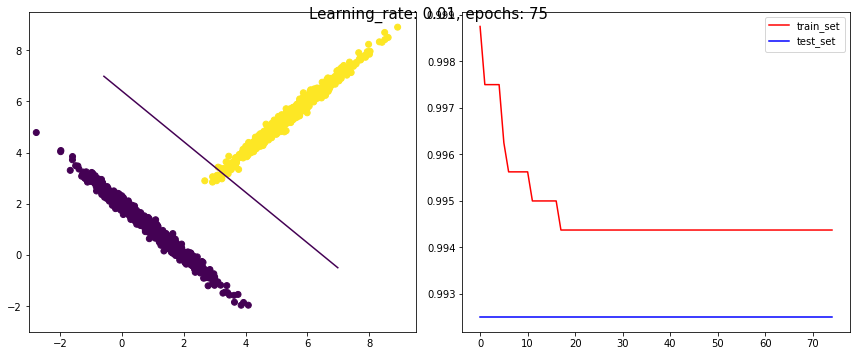

train


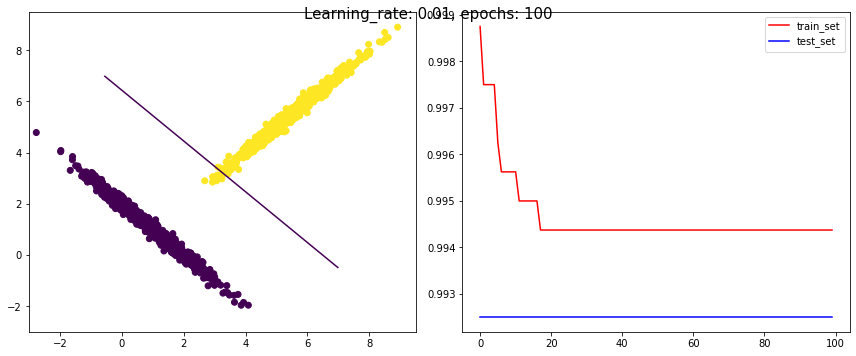

train
train
train
train
train
train
train
train
train
train
train
train
{
    "0.0001": [
        {
            "10": {
                "accuracy_test": 0.97,
                "accuracy_train": 0.978125
            }
        },
        {
            "20": {
                "accuracy_test": 0.99,
                "accuracy_train": 0.9975
            }
        },
        {
            "30": {
                "accuracy_test": 0.995,
                "accuracy_train": 0.998125
            }
        },
        {
            "50": {
                "accuracy_test": 1.0,
                "accuracy_train": 1.0
            }
        },
        {
            "75": {
                "accuracy_test": 0.995,
                "accuracy_train": 0.999375
            }
        },
        {
            "100": {
                "accuracy_test": 0.9925,
                "accuracy_train": 0.9975
            }
        }
    ],
    "0.001": [
        {
            "10": {
                "accuracy_test": 0.9925,
 

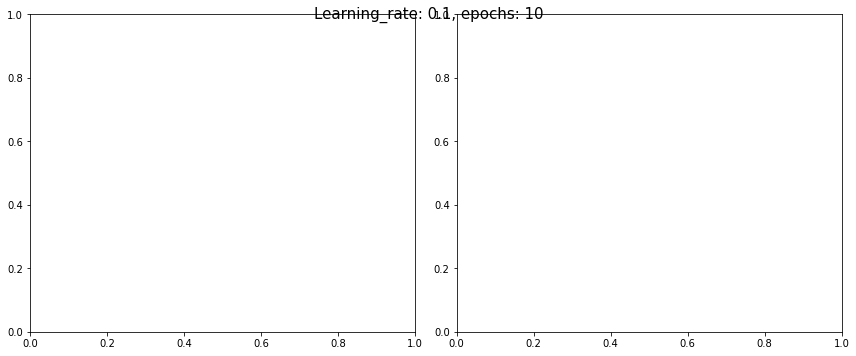

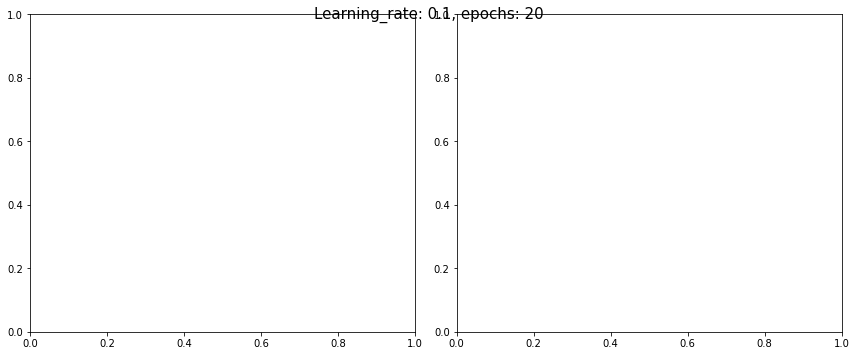

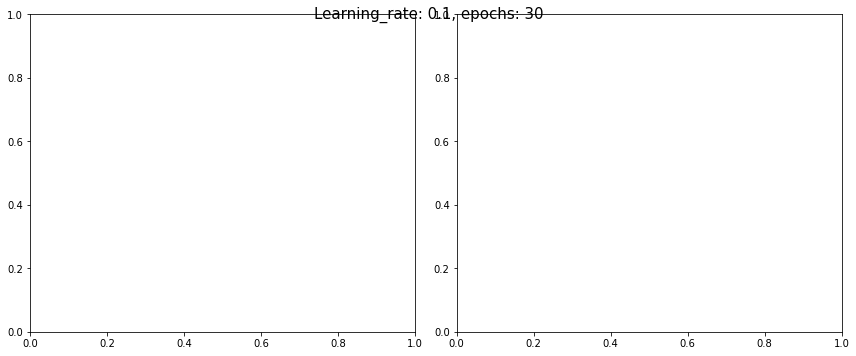

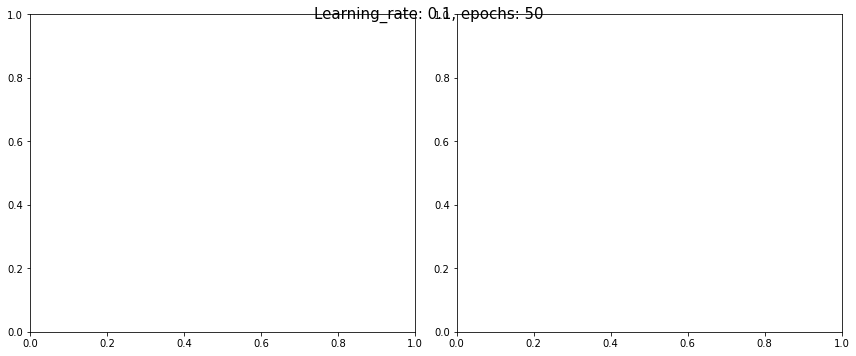

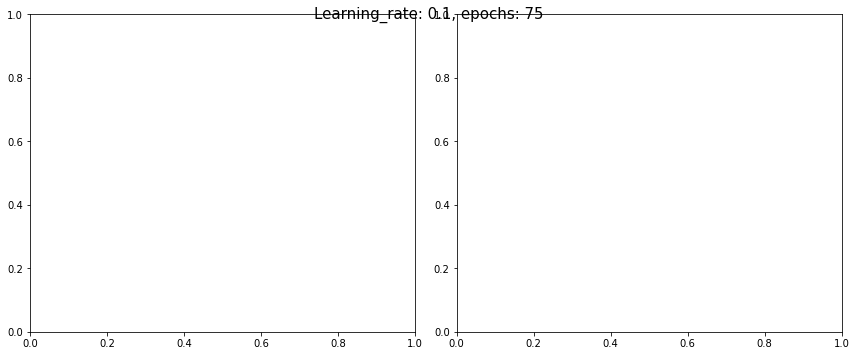

...

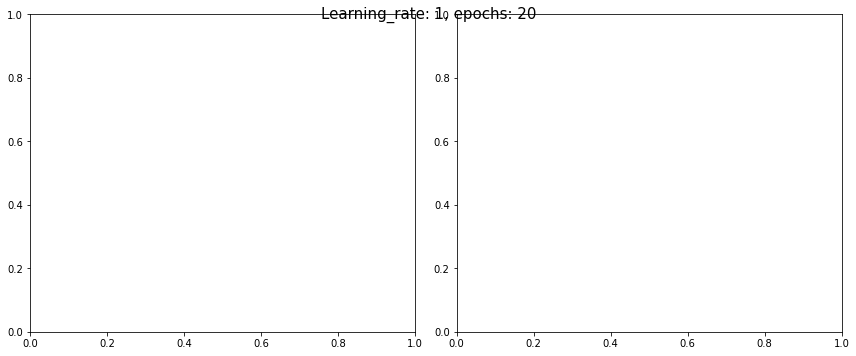

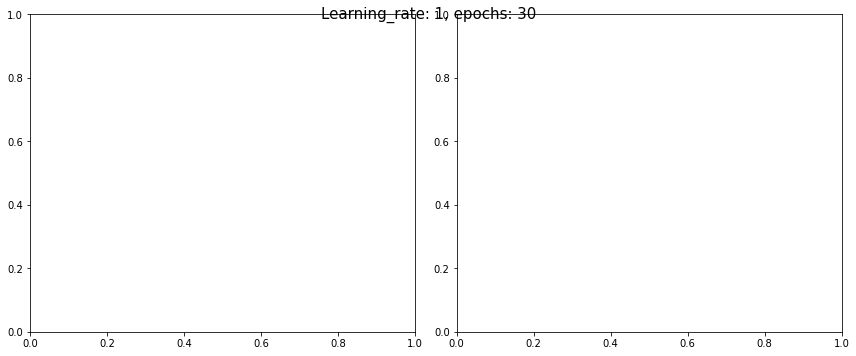

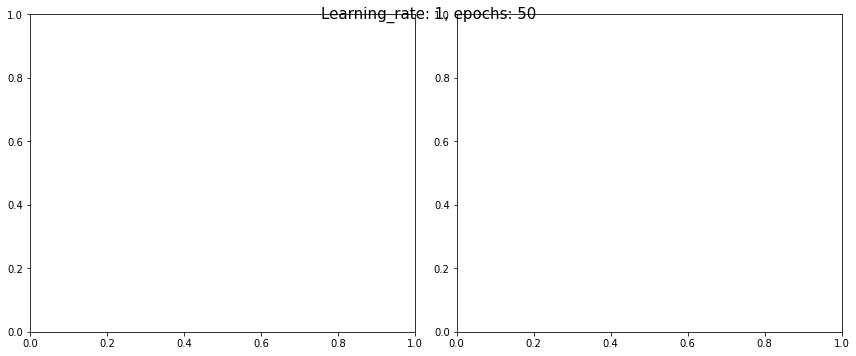

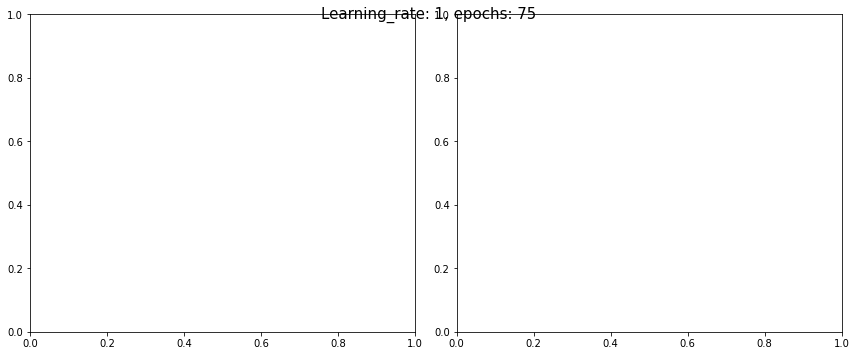

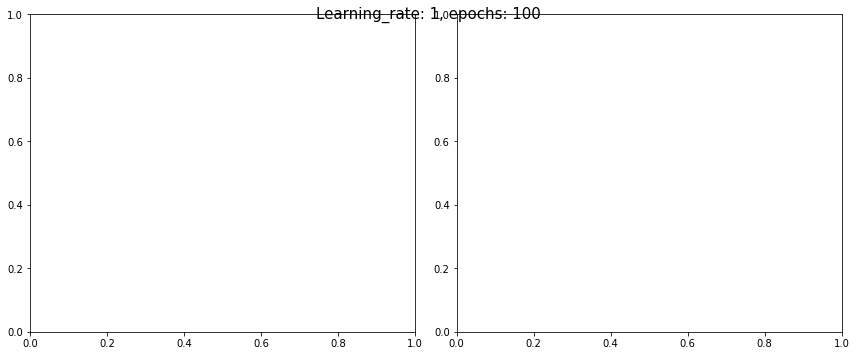

In [8]:
learning_rate = [1e-05, 1e-04, 1e-03, 0.01, 0.1, 1]
epochs = [10, 20, 30, 50, 75, 100]
inputs = train_df_2.copy(deep=True)
test_inputs = test_df_2.copy(deep=True)
inputs['label'] = inputs['label'].replace([0], -1)
test_inputs['label'] = test_inputs['label'].replace([0], -1)
result = {}
for alpha in learning_rate:
  result[f'{alpha}'] = [] 
  for ep in epochs:
    adaline = Adaline(no_of_inputs = 2, activation_function='identity',order = 1,epochs = ep,learning_rate=alpha)
    plt.rcParams["figure.autolayout"] = True
    fig, ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f"Learning_rate: {alpha}, epochs: {ep}", fontsize=15)
    res = adaline.train(inputs.to_numpy()[:,0:2],inputs.to_numpy()[:,2],test_inputs.to_numpy()[:,0:2],test_inputs.to_numpy()[:,2],batch=-1)   
    if res:     
      accuracy_train, accuracy_test = adaline.decision_boundary(inputs[inputs.columns[0:2]],inputs[inputs.columns[2:3]],ax)
      result[f'{alpha}'].append({f'{ep}':{'accuracy_train':accuracy_train, 'accuracy_test':accuracy_test}}) 
      adaline.plot_accuracy(ax)
      plt.show()
print(json.dumps(result,sort_keys=True, indent=4))

## Dataset 3

train


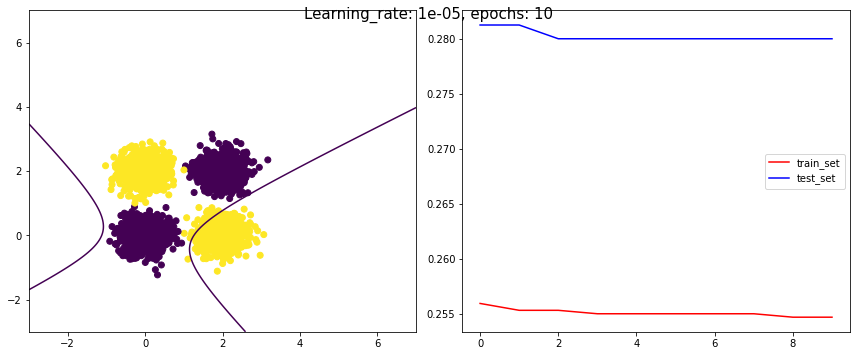

train


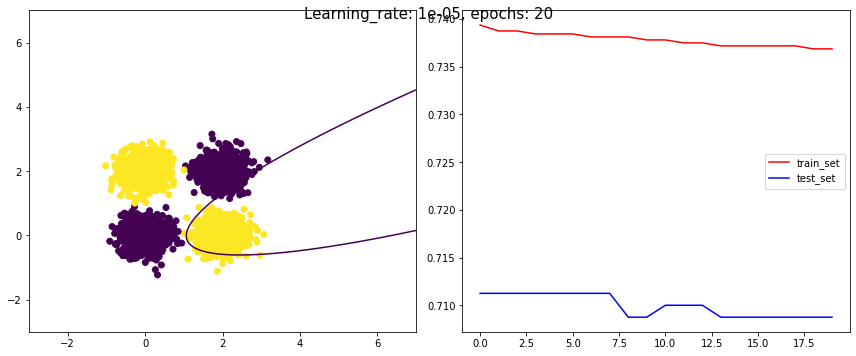

train


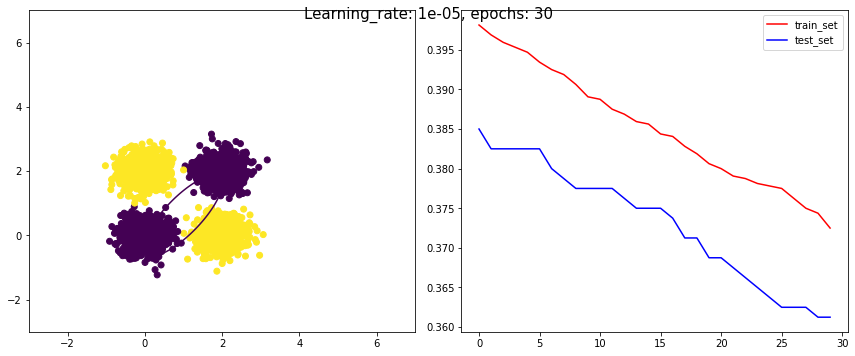

train


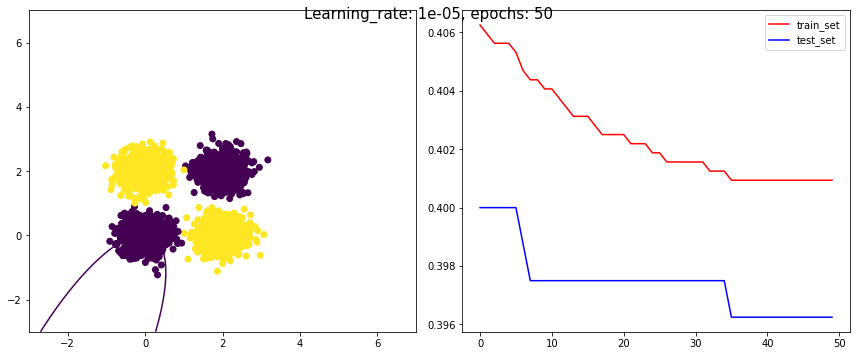

train


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: UserWarning: No contour levels were found within the data range.


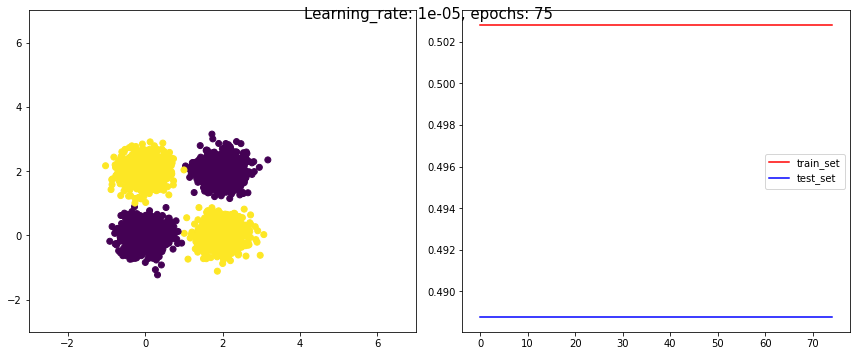

train


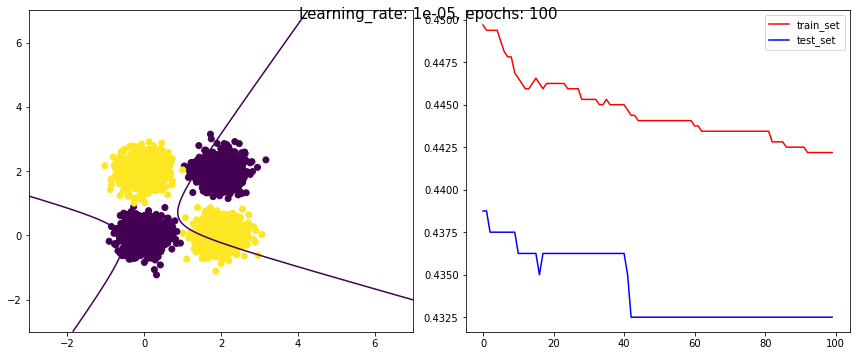

train


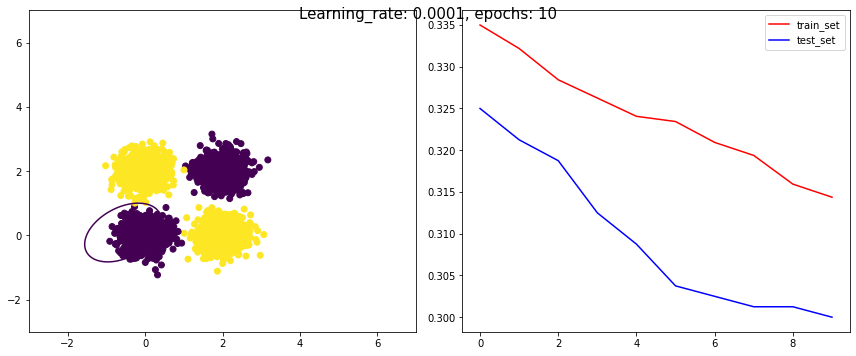

train


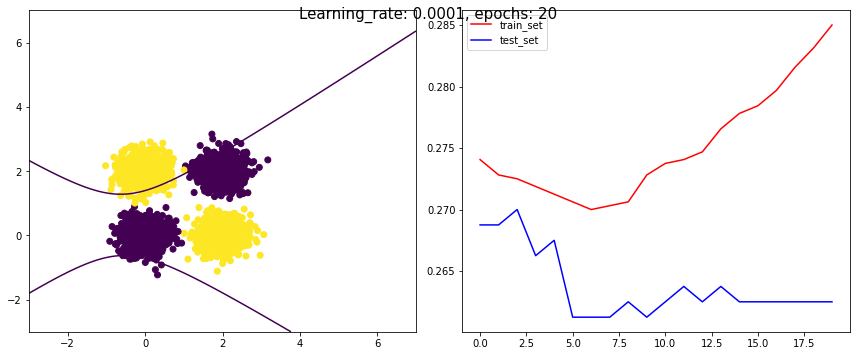

train


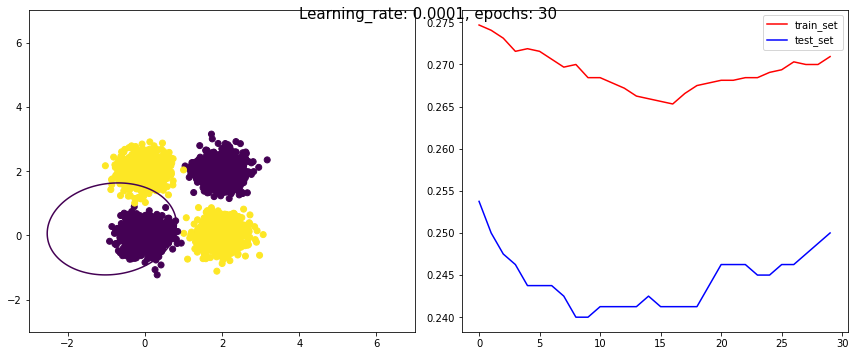

train


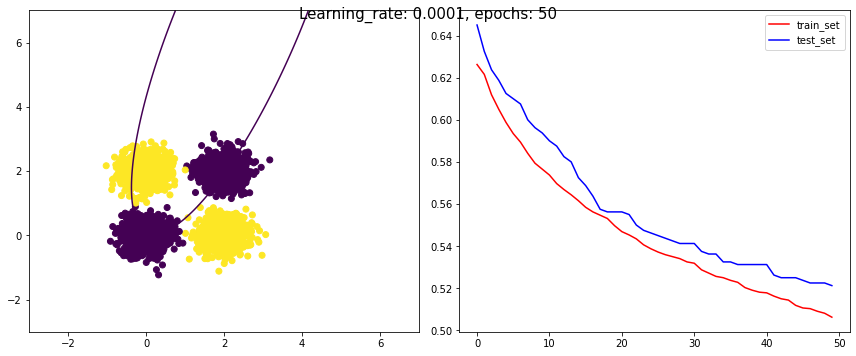

train


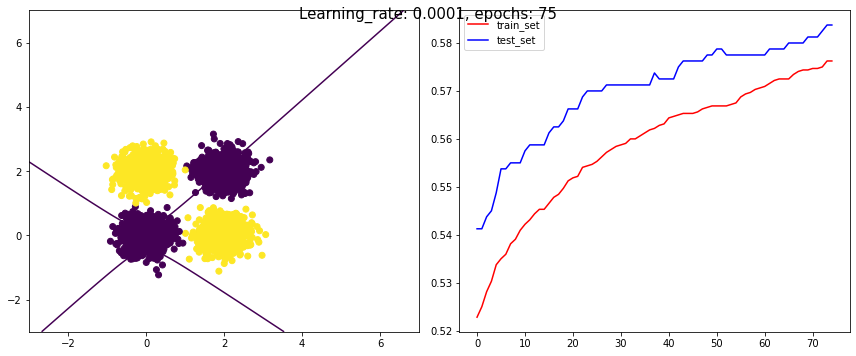

train


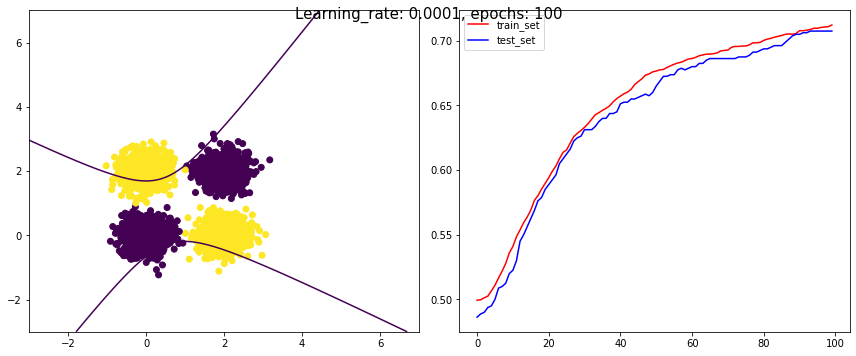

train


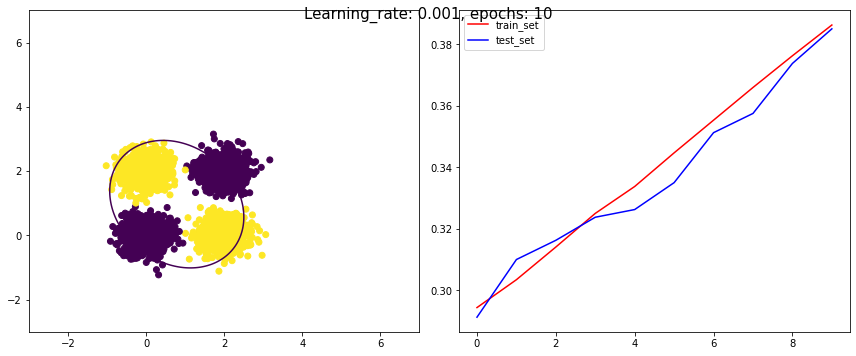

train


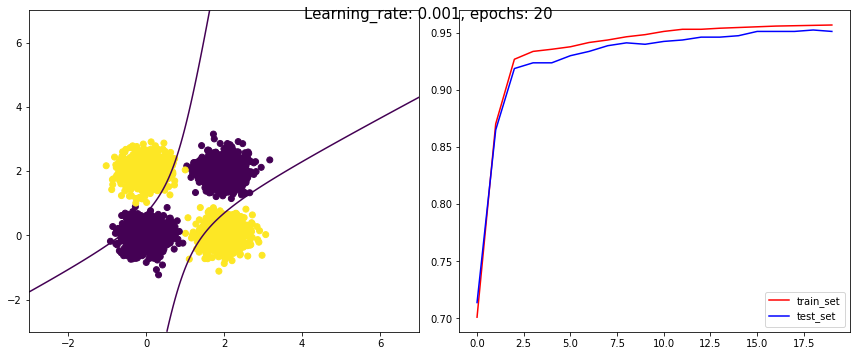

train


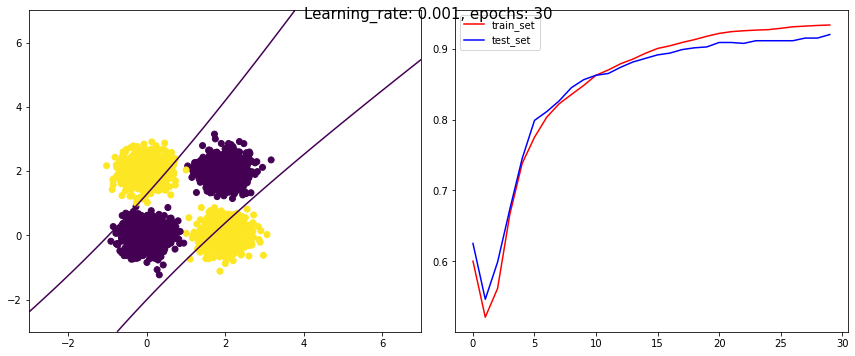

train


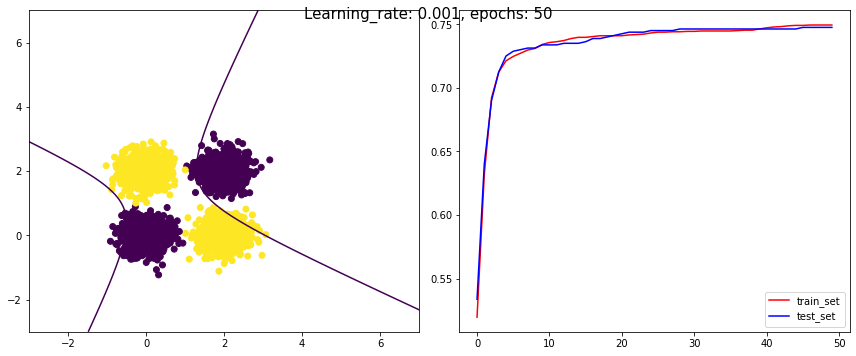

train


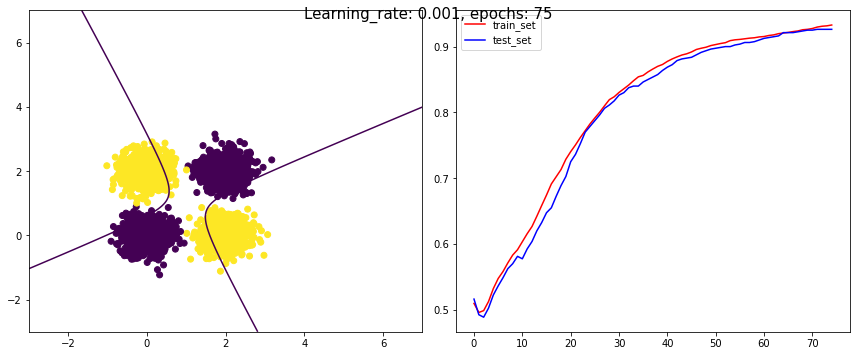

train


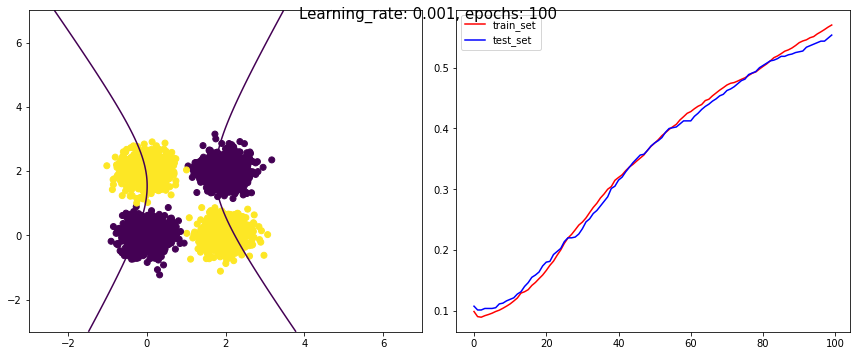

train


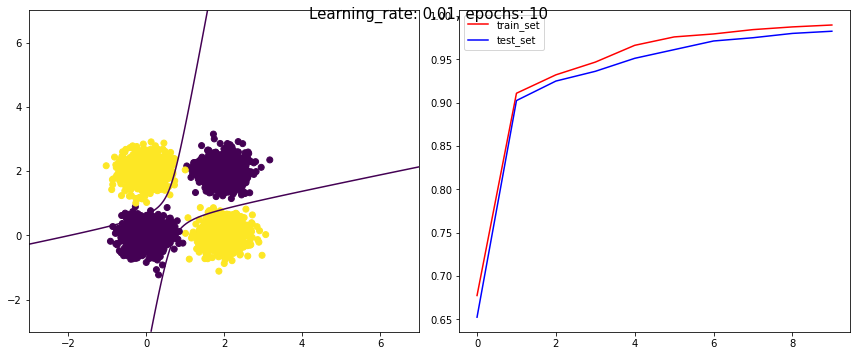

train


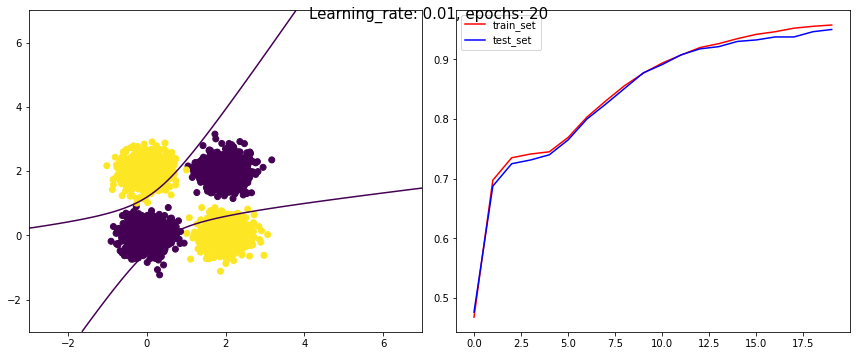

train


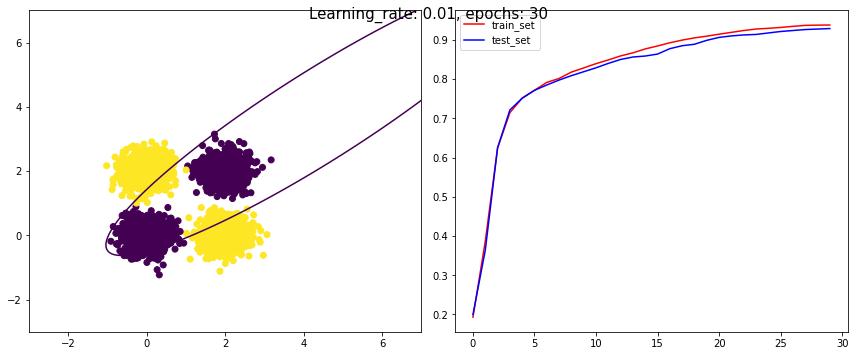

train


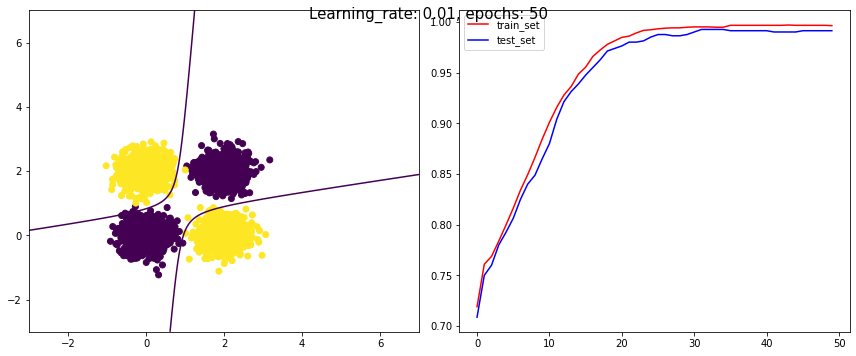

train


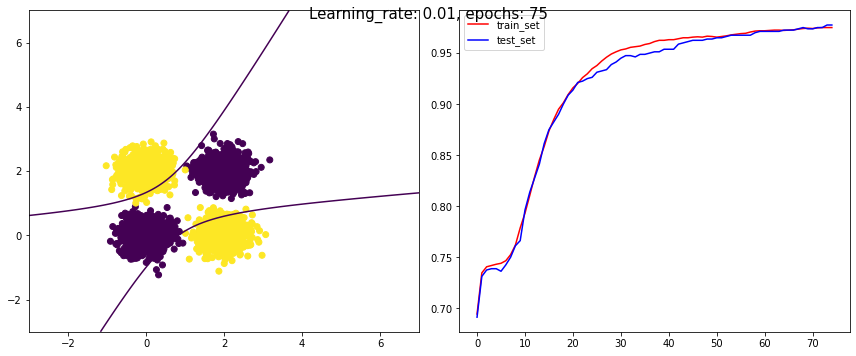

train


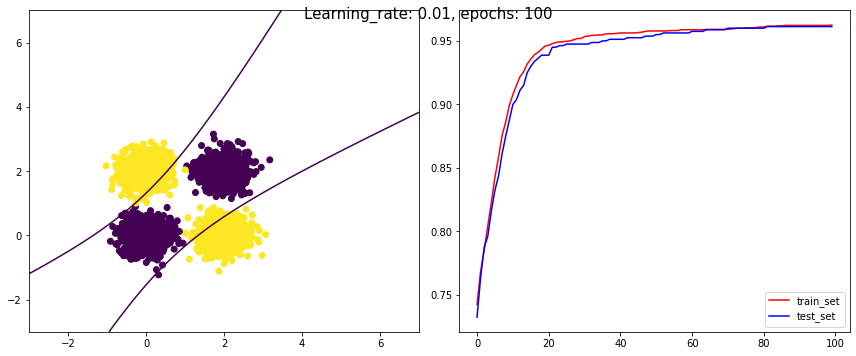

train


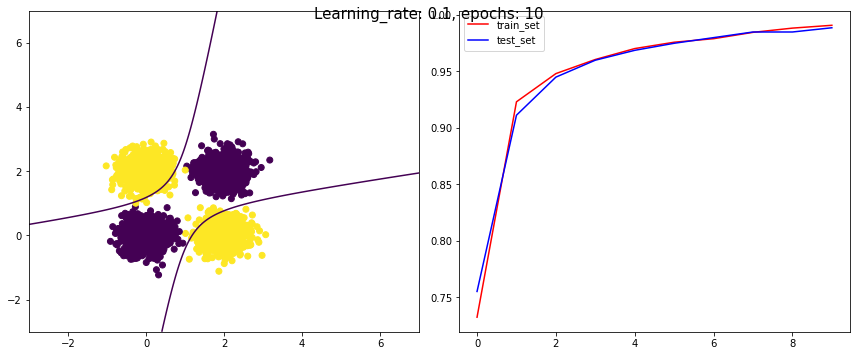

train


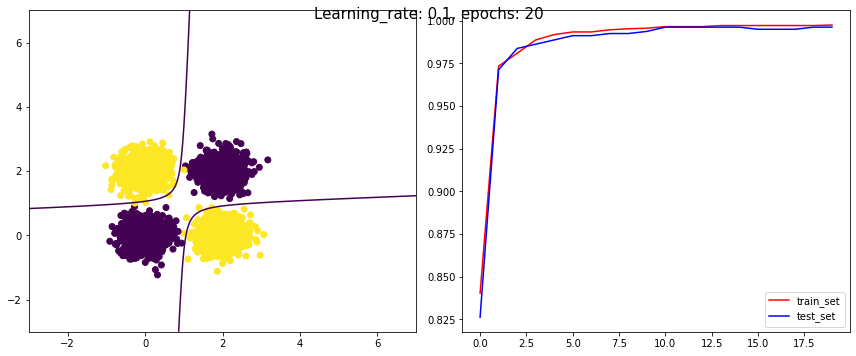

train


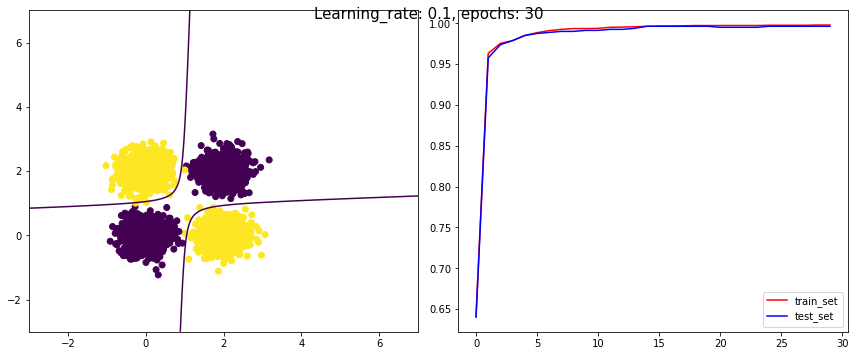

train


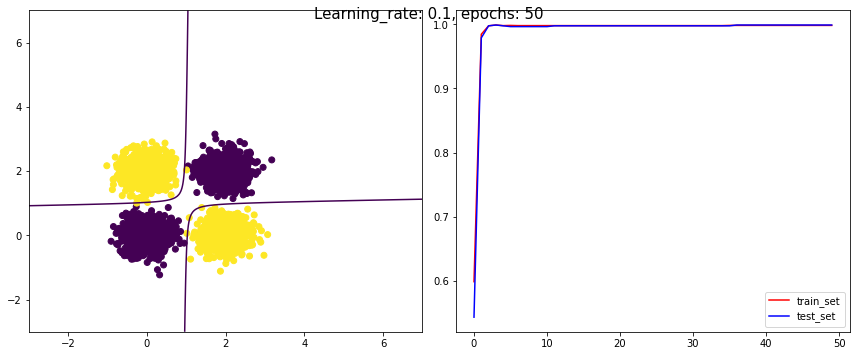

train


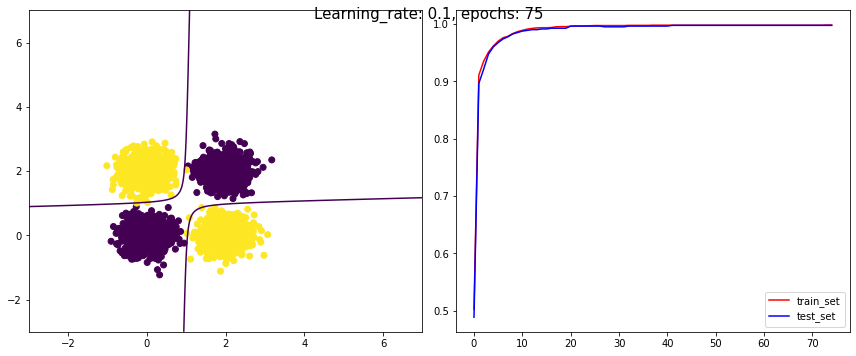

train


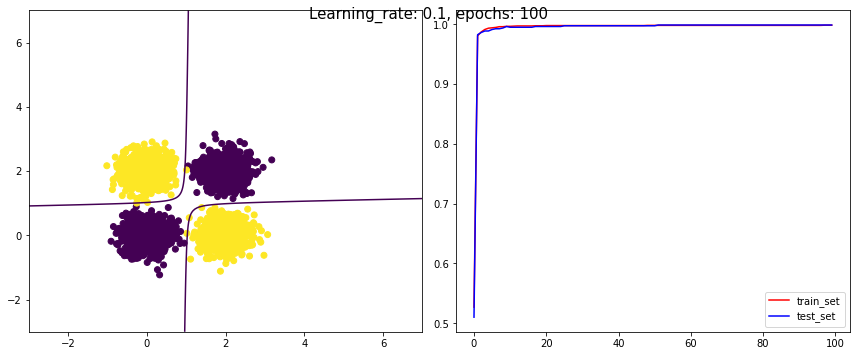

train


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: overflow encountered in add


train
train
train
train
train
{
    "0.0001": [
        {
            "10": {
                "accuracy_test": 0.3,
                "accuracy_train": 0.314375
            }
        },
        {
            "20": {
                "accuracy_test": 0.2625,
                "accuracy_train": 0.285
            }
        },
        {
            "30": {
                "accuracy_test": 0.25,
                "accuracy_train": 0.2709375
            }
        },
        {
            "50": {
                "accuracy_test": 0.52125,
                "accuracy_train": 0.50625
            }
        },
        {
            "75": {
                "accuracy_test": 0.58375,
                "accuracy_train": 0.57625
            }
        },
        {
            "100": {
                "accuracy_test": 0.7075,
                "accuracy_train": 0.7121875
            }
        }
    ],
    "0.001": [
        {
            "10": {
                "accuracy_test": 0.385,
                "accuracy_train"

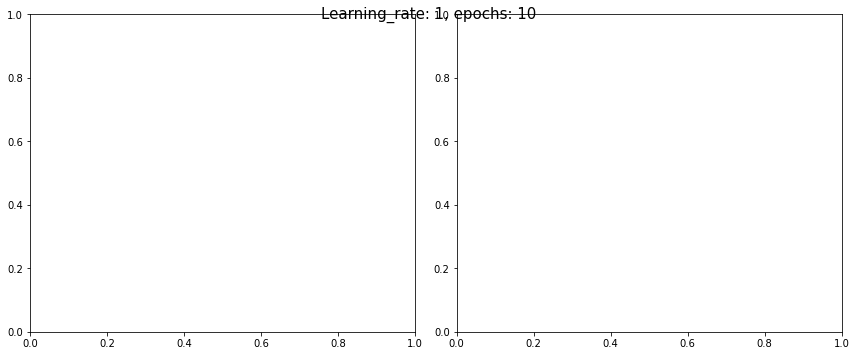

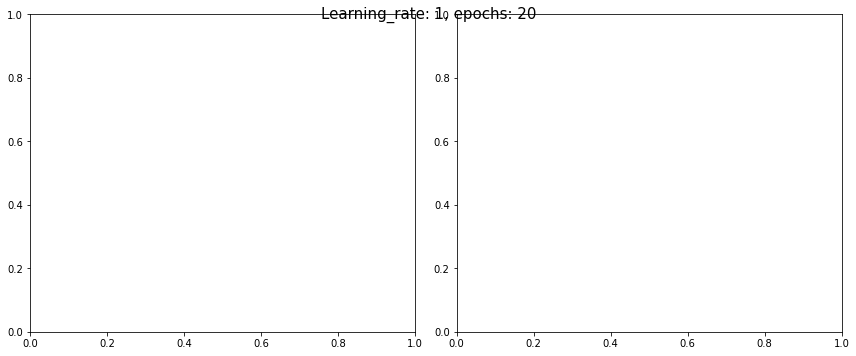

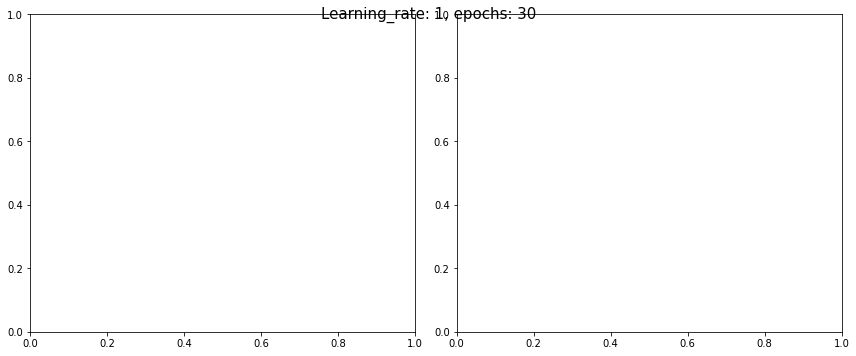

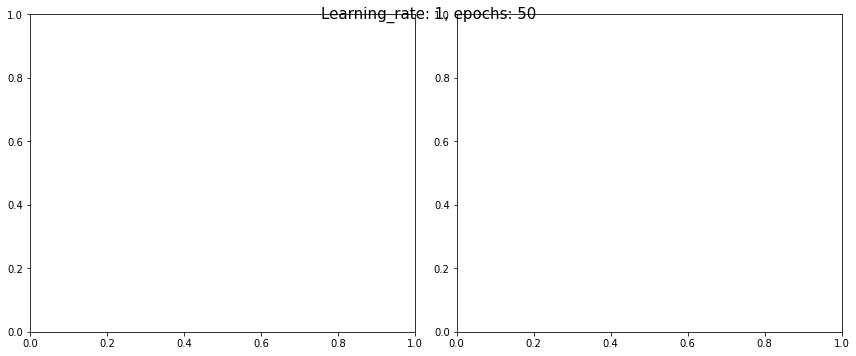

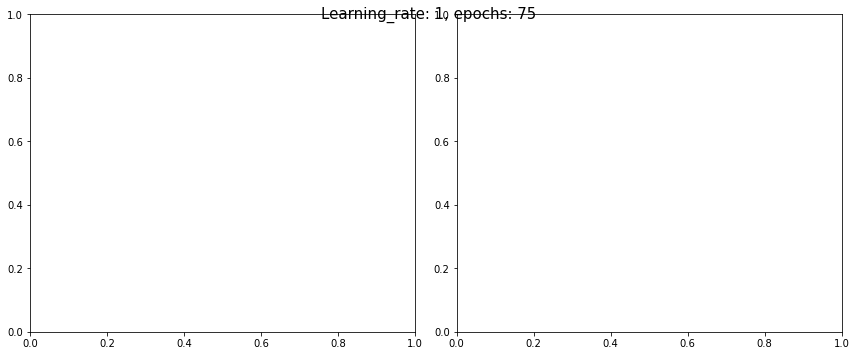

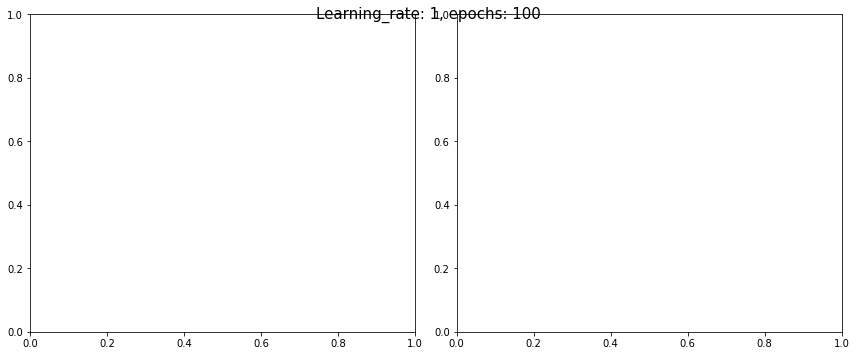

In [9]:
learning_rate = [1e-05, 1e-04, 1e-03, 0.01, 0.1, 1]
epochs = [10, 20, 30, 50, 75, 100]
inputs = train_df_3.copy(deep=True)
test_inputs = test_df_3.copy(deep=True)
inputs['label'] = inputs['label'].replace([0], -1)
test_inputs['label'] = test_inputs['label'].replace([0], -1)
result = {}
for alpha in learning_rate:
  result[f'{alpha}'] = [] 
  for ep in epochs:
    adaline = Adaline(no_of_inputs = 2, activation_function='identity',order = 2,epochs = ep,learning_rate=alpha)
    plt.rcParams["figure.autolayout"] = True
    fig, ax = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(f"Learning_rate: {alpha}, epochs: {ep}", fontsize=15)
    res = adaline.train(inputs.to_numpy()[:,0:2],inputs.to_numpy()[:,2],test_inputs.to_numpy()[:,0:2],test_inputs.to_numpy()[:,2],batch=100)   
    if res:     
      accuracy_train, accuracy_test = adaline.decision_boundary(inputs[inputs.columns[0:2]],inputs[inputs.columns[2:3]],ax)
      result[f'{alpha}'].append({f'{ep}':{'accuracy_train':accuracy_train, 'accuracy_test':accuracy_test}}) 
      adaline.plot_accuracy(ax)
      plt.show()
print(json.dumps(result,sort_keys=True, indent=4))
